In [1]:
import os, time, copy
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm.auto import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, random_split, Subset, DataLoader, WeightedRandomSampler
from torchvision import datasets, transforms

torch.manual_seed(42)
np.random.seed(42)
# [NEW] 01~07.ipynb에 없는 설정: cudnn 연산의 비결정성을 줄여 재현성을 높인다
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

import platform
from matplotlib import font_manager

system = platform.system()
if system == 'Windows':
    plt.rc('font', family='Malgun Gothic')
elif system == 'Darwin':
    plt.rc('font', family='AppleGothic')
else:
    font_dir = '/usr/share/fonts/truetype/nanum'
    font_files = font_manager.findSystemFonts(fontpaths=font_dir)
    for fpath in font_files:
        font_manager.fontManager.addfont(fpath)
    plt.rc('font', family='NanumGothic')

plt.rcParams['axes.unicode_minus'] = False
print('적용된 폰트:', plt.rcParams['font.family'])


cuda
적용된 폰트: ['Malgun Gothic']


# 쓰레기 이미지 12종 분류 — 데이터 정제 반영 재구축

`A2_label_error_detection.ipynb`(1차 파이프라인)와 `A1_duplicate_detection.ipynb`(중복·라벨오류 탐지)에서 찾아낸 문제를, **팀 논의로 확정한 정제 원칙**에 따라 반영한 뒤 모델링 파이프라인을 다시 학습·평가한다.

**정제 원칙 (팀 합의, `docs/data_cleaning_summary.md` 참고)**

| 구분 | 처리 |
|---|---|
| 완전 동일 중복 | 제거 |
| 근접 중복 | 삭제하지 않고 같은 data split에만 배치 |
| 라벨 오류 | 맞는 라벨로 정정 |
| 애매한 경계 / 비사진 파일 | 삭제 |

원본 `garbage_classification/` 폴더의 파일은 옮기거나 지우지 않는다. 대신 **매니페스트(파일 경로 → 최종 라벨) 테이블**을 코드로 만들어 반영한다.

---

## 이 노트북을 읽는 순서 — 최종 모델은 12절 기준이다

개선을 반복하면서 최종 모델이 세 번 바뀌었다. **아래 표의 마지막 줄이 실제 채택 모델**이고, 앞 절의 수치는 그 결정에 이르는 과정 기록이다.

| 버전 | 변경 내용 | 절 | test accuracy | test macro-F1 |
|---|---|---|---:|---:|
| v3 | 정제 + 그리드 재탐색 (128px, lr 5e-5) | 4 ~ 9 | 0.9773 | 0.9671 |
| v4 | 입력 해상도 128 → **224** | 11 | 0.9854 | 0.9786 |
| **v5 (최종)** | 224px 안에서 lr 5e-5 → **1e-4** | 11-1 · 12 · 13 | **0.9859** | **0.9787** |

> **4 ~ 9절의 수치는 v3(128px) 기록이다.** 아키텍처와 불균형 대응 방식을 고른 근거로서 그대로 유효하지만,
> **최종 test 평가 · 혼동행렬 · Grad-CAM · 오분류 확인은 12절이 v5 기준으로 다시 수행한 것**을 따른다.
> 팀 분석 노트북(`03_Team_Analysis.ipynb`)이 입력으로 쓰는 확률 파일도 13절에서 v5 기준으로 갱신했다.

**검증셋으로만 고르고 test 는 각 채택 시점에 한 번씩만 열었다.** 해상도(11절)와 학습률(11-1절) 채택 판단은 전부 val macro-F1 으로 내렸고, test 결과를 보고 되돌리지 않았다.

EDA(클래스별 샘플 이미지, 이미지 크기/모드/손상 여부 점검)는 정제로 달라지지 않는 부분이라 `01_EDA.ipynb` 결과를 참고하고, 이 노트북은 정제 전/후 클래스 분포 비교부터 시작한다.

## 1. 원본 데이터 현황 (요약)

In [2]:
data_dir = './garbage_classification'
class_names = sorted(os.listdir(data_dir))
raw_counts = {c: len(glob(os.path.join(data_dir, c, '*.jpg'))) for c in class_names}

print(f'클래스 수: {len(class_names)}개, 전체 이미지 수(정제 전): {sum(raw_counts.values())}장')
for c, n in raw_counts.items():
    print(f'{c:12s}: {n:5d}장')


클래스 수: 12개, 전체 이미지 수(정제 전): 15515장
battery     :   945장
biological  :   985장
brown-glass :   607장
cardboard   :   891장
clothes     :  5325장
green-glass :   629장
metal       :   769장
paper       :  1050장
plastic     :   865장
shoes       :  1977장
trash       :   697장
white-glass :   775장


## 2. 데이터 정제 — 매니페스트 구성 (팀 합의안 반영)

`appendix/A1_duplicate_detection.ipynb`(자동 탐지 + 사람 육안 검토) → `docs/label_review_report.md`(train OOF까지 확장 검토) → `docs/data_cleaning_summary.md`(최종 정리)를 거쳐 확정된 목록을 반영한다.

In [3]:
# --- 1) 완전 동일 중복(MD5) - 같은 클래스: 파일명 기준 한쪽만 제거 (16장) ---
exact_dup_delete_same_class = [
    'clothes5234.jpg',
    'green-glass530.jpg', 'green-glass555.jpg', 'green-glass443.jpg', 'green-glass554.jpg',
    'green-glass461.jpg', 'green-glass459.jpg', 'green-glass564.jpg', 'green-glass517.jpg',
    'green-glass563.jpg', 'green-glass482.jpg', 'green-glass561.jpg', 'green-glass565.jpg',
    'green-glass544.jpg', 'green-glass492.jpg', 'green-glass592.jpg',
]

# --- 2) 완전 동일 중복(MD5) - 클래스가 다름: 라벨 신뢰 불가로 양쪽 다 제거 (3쌍 6장) ---
cross_class_exact_dup_pairs = [
    ('metal459.jpg', 'white-glass412.jpg'),
    ('plastic159.jpg', 'white-glass129.jpg'),
    ('plastic556.jpg', 'white-glass761.jpg'),
]
cross_class_exact_dup_delete = [f for pair in cross_class_exact_dup_pairs for f in pair]

# --- 3) 근접 중복(dHash+픽셀 검증, 사람이 오탐 제외까지 마침): 삭제하지 않고 같은 split 단위로 묶음 (42그룹) ---
near_dup_groups = [
    ('battery268.jpg', 'battery343.jpg'),
    ('battery63.jpg', 'battery833.jpg'),
    ('battery759.jpg', 'battery945.jpg'),
    ('biological401.jpg', 'biological709.jpg'),
    ('biological402.jpg', 'biological781.jpg'),
    ('biological410.jpg', 'biological865.jpg'),
    ('brown-glass19.jpg', 'brown-glass439.jpg'),
    ('clothes2051.jpg', 'clothes5234.jpg'),
    ('clothes5095.jpg', 'clothes536.jpg'),
    ('green-glass190.jpg', 'green-glass46.jpg'),
    ('green-glass2.jpg', 'green-glass292.jpg', 'green-glass443.jpg'),
    ('green-glass228.jpg', 'green-glass433.jpg'),
    ('green-glass231.jpg', 'green-glass530.jpg'),
    ('green-glass285.jpg', 'green-glass555.jpg'),
    ('green-glass336.jpg', 'green-glass554.jpg'),
    ('green-glass349.jpg', 'green-glass461.jpg'),
    ('green-glass388.jpg', 'green-glass459.jpg'),
    ('green-glass403.jpg', 'green-glass564.jpg'),
    ('green-glass413.jpg', 'green-glass517.jpg', 'green-glass563.jpg'),
    ('green-glass422.jpg', 'green-glass482.jpg'),
    ('green-glass424.jpg', 'green-glass561.jpg'),
    ('green-glass449.jpg', 'green-glass565.jpg'),
    ('green-glass451.jpg', 'green-glass488.jpg'),
    ('green-glass471.jpg', 'green-glass544.jpg'),
    ('green-glass476.jpg', 'green-glass492.jpg'),
    ('green-glass583.jpg', 'green-glass592.jpg'),
    ('metal459.jpg', 'white-glass412.jpg'),
    ('metal590.jpg', 'metal745.jpg'),
    ('plastic159.jpg', 'white-glass129.jpg'),
    ('plastic467.jpg', 'plastic506.jpg'),
    ('plastic556.jpg', 'white-glass761.jpg'),
    ('shoes1049.jpg', 'shoes1390.jpg'),
    ('shoes1065.jpg', 'shoes1482.jpg', 'shoes651.jpg'),
    ('shoes1095.jpg', 'shoes777.jpg'),
    ('shoes1128.jpg', 'shoes615.jpg'),
    ('shoes1227.jpg', 'shoes1368.jpg'),
    ('shoes29.jpg', 'shoes621.jpg'),
    ('trash238.jpg', 'trash301.jpg'),
    ('trash254.jpg', 'trash559.jpg'),
    ('trash683.jpg', 'trash688.jpg'),
    ('white-glass300.jpg', 'white-glass472.jpg'),
    ('white-glass674.jpg', 'white-glass688.jpg'),
]

# --- 4) 라벨 오류: 맞는 라벨로 정정 (46장) ---
clothes_to_shoes = [
    'clothes3062.jpg', 'clothes3330.jpg', 'clothes5002.jpg', 'clothes2197.jpg', 'clothes4465.jpg',
    'clothes1229.jpg', 'clothes2272.jpg', 'clothes791.jpg', 'clothes4836.jpg', 'clothes5277.jpg',
    'clothes5181.jpg', 'clothes3623.jpg', 'clothes3807.jpg', 'clothes451.jpg', 'clothes2162.jpg',
    'clothes4329.jpg', 'clothes255.jpg', 'clothes559.jpg', 'clothes2185.jpg', 'clothes4319.jpg',
    'clothes4611.jpg', 'clothes5201.jpg', 'clothes2556.jpg', 'clothes1015.jpg', 'clothes82.jpg',
    'clothes3374.jpg', 'clothes4466.jpg', 'clothes4635.jpg', 'clothes2334.jpg', 'clothes2654.jpg',
    'clothes4150.jpg', 'clothes1312.jpg', 'clothes4293.jpg', 'clothes2733.jpg', 'clothes53.jpg',
    'clothes3206.jpg', 'clothes5045.jpg', 'clothes1444.jpg', 'clothes4495.jpg', 'clothes4469.jpg',
    'clothes3895.jpg', 'clothes1582.jpg', 'clothes3545.jpg',
]
label_corrections = {f: 'shoes' for f in clothes_to_shoes}
label_corrections['shoes1826.jpg'] = 'clothes'
label_corrections['white-glass704.jpg'] = 'green-glass'
label_corrections['paper9.jpg'] = 'plastic'

# --- 5) 애매한 경계 / 비사진 파일: 삭제 (3장 + 6장) ---
exclude_ambiguous = ['white-glass58.jpg', 'shoes379.jpg', 'clothes526.jpg']
exclude_nonphoto = ['trash223.jpg', 'plastic605.jpg', 'white-glass112.jpg',
                    'metal502.jpg', 'green-glass372.jpg', 'shoes1878.jpg']

assert len(exact_dup_delete_same_class) == 16
assert len(cross_class_exact_dup_delete) == 6
assert len(near_dup_groups) == 42
assert len(label_corrections) == 46
assert len(exclude_ambiguous) == 3
assert len(exclude_nonphoto) == 6
print('정제 규칙 목록 건수 확인 완료')


정제 규칙 목록 건수 확인 완료


In [4]:
# 전체 파일을 스캔해 (경로, 원본 클래스, 파일명) 목록을 만든 뒤, 위 규칙을 반영한 매니페스트를 구성한다.
# 파일을 실제로 옮기거나 지우지 않고, 이 매니페스트(리스트)만으로 최종 라벨/제외 여부를 관리한다.
all_files = []
for c in class_names:
    for p in sorted(glob(os.path.join(data_dir, c, '*.jpg'))):
        all_files.append({'path': p, 'orig_class': c, 'fname': os.path.basename(p)})

exclude_set = (set(exact_dup_delete_same_class) | set(cross_class_exact_dup_delete)
              | set(exclude_ambiguous) | set(exclude_nonphoto))

manifest = []
for item in all_files:
    if item['fname'] in exclude_set:
        continue
    final_class = label_corrections.get(item['fname'], item['orig_class'])
    manifest.append({'path': item['path'], 'orig_class': item['orig_class'],
                     'class': final_class, 'fname': item['fname']})

n_relabeled = sum(1 for m in manifest if m['class'] != m['orig_class'])

print(f'스캔한 전체 파일 수: {len(all_files)}장')
print(f'제외(완전동일중복 {len(exact_dup_delete_same_class) + len(cross_class_exact_dup_delete)}장 '
      f'+ 애매/비사진 {len(exclude_ambiguous) + len(exclude_nonphoto)}장) = {len(exclude_set)}장')
print(f'정제 후 남은 파일 수: {len(manifest)}장')
print(f'라벨 정정 반영: {n_relabeled}장')
assert len(manifest) == len(all_files) - len(exclude_set)
assert n_relabeled == len(label_corrections)


스캔한 전체 파일 수: 15515장
제외(완전동일중복 22장 + 애매/비사진 9장) = 31장
정제 후 남은 파일 수: 15484장
라벨 정정 반영: 46장


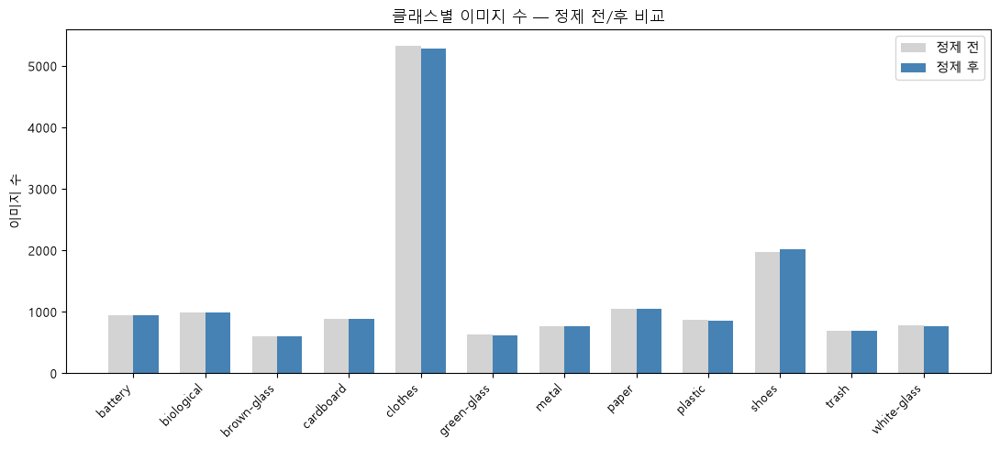

클래스             정제 전    정제 후      증감
battery          945     945      +0
biological       985     985      +0
brown-glass      607     607      +0
cardboard        891     891      +0
clothes         5325    5281     -44
green-glass      629     614     -15
metal            769     767      -2
paper           1050    1049      -1
plastic          865     863      -2
shoes           1977    2017     +40
trash            697     696      -1
white-glass      775     769      -6

정제 후 최다: clothes(5281장) / 최소: brown-glass(607장) / 비율: 8.70배


In [5]:
from collections import Counter

clean_counts = Counter(m['class'] for m in manifest)
clean_counts = {c: clean_counts.get(c, 0) for c in class_names}

x = np.arange(len(class_names))
width = 0.35
plt.figure(figsize=(11, 5))
plt.bar(x - width/2, [raw_counts[c] for c in class_names], width, label='정제 전', color='lightgray')
plt.bar(x + width/2, [clean_counts[c] for c in class_names], width, label='정제 후', color='steelblue')
plt.xticks(x, class_names, rotation=45, ha='right')
plt.ylabel('이미지 수')
plt.title('클래스별 이미지 수 — 정제 전/후 비교')
plt.legend()
plt.tight_layout()
plt.show()

print(f'{"클래스":12s}{"정제 전":>8s}{"정제 후":>8s}{"증감":>8s}')
for c in class_names:
    diff = clean_counts[c] - raw_counts[c]
    print(f'{c:12s}{raw_counts[c]:8d}{clean_counts[c]:8d}{diff:+8d}')

max_c = max(clean_counts, key=clean_counts.get)
min_c = min(clean_counts, key=clean_counts.get)
print(f'\n정제 후 최다: {max_c}({clean_counts[max_c]}장) / 최소: {min_c}({clean_counts[min_c]}장) '
      f'/ 비율: {clean_counts[max_c] / clean_counts[min_c]:.2f}배')


## 3. 데이터 분할

`appendix/A2_label_error_detection.ipynb`와 같은 방식(클래스별 70/15/15 stratified 분할, 근접 중복은 Union-Find로 묶어 같은 split에만 배치)을 매니페스트 기준으로 적용한다.

In [6]:
# 매니페스트에 최종 라벨의 정수 인덱스 부여
class_to_idx = {c: i for i, c in enumerate(class_names)}
targets = np.array([class_to_idx[m['class']] for m in manifest])
paths = [m['path'] for m in manifest]
fnames = [m['fname'] for m in manifest]
fname_to_idx = {f: i for i, f in enumerate(fnames)}  # 파일명은 데이터셋 전체에서 유일함

# 근접 중복 그룹을 같은 분할 단위(cluster)로 묶는다 (appendix/A2_label_error_detection.ipynb와 동일한 Union-Find 방식)
# [NEW] 01~07.ipynb에 없는 기법: Union-Find로 근접 중복 파일들을 같은 분할 단위로 묶음
class UnionFind:
    def __init__(self, n):
        self.parent = list(range(n))
    def find(self, x):
        while self.parent[x] != x:
            self.parent[x] = self.parent[self.parent[x]]
            x = self.parent[x]
        return x
    def union(self, a, b):
        ra, rb = self.find(a), self.find(b)
        if ra != rb:
            self.parent[ra] = rb

uf = UnionFind(len(manifest))
for group in near_dup_groups:
    members = [fname_to_idx[f] for f in group if f in fname_to_idx]
    for m_idx in members[1:]:
        uf.union(members[0], m_idx)

from collections import defaultdict
clusters_by_root = defaultdict(list)
for i in range(len(manifest)):
    clusters_by_root[uf.find(i)].append(i)
clusters = list(clusters_by_root.values())
n_multi = sum(1 for c in clusters if len(c) > 1)
print(f'분할 단위(덩어리) 수: {len(clusters)}개 (이 중 {n_multi}개는 근접 중복을 하나로 묶은 덩어리)')

# 클래스별 70/15/15 분할을 덩어리 단위로 수행
train_idx, val_idx, test_idx = [], [], []
rng = np.random.RandomState(42)
for c_idx in range(len(class_names)):
    c_clusters = [cluster for cluster in clusters if targets[cluster[0]] == c_idx]
    rng.shuffle(c_clusters)

    n = sum(len(cluster) for cluster in c_clusters)
    n_train = int(n * 0.7)
    n_val = int(n * 0.15)

    cum = 0
    for cluster in c_clusters:
        if cum < n_train:
            train_idx += cluster
        elif cum < n_train + n_val:
            val_idx += cluster
        else:
            test_idx += cluster
        cum += len(cluster)

print(f'train {len(train_idx)} / val {len(val_idx)} / test {len(test_idx)} '
      f'(총 {len(train_idx) + len(val_idx) + len(test_idx)})')


분할 단위(덩어리) 수: 15458개 (이 중 25개는 근접 중복을 하나로 묶은 덩어리)
train 10832 / val 2318 / test 2334 (총 15484)


In [7]:
# 클래스 불균형 대응 (A): train 기준 1/count 클래스 가중치
train_targets = targets[train_idx]
counts = np.array([np.sum(train_targets == c) for c in range(len(class_names))])
class_weight_np = (1.0 / counts) * (counts.sum() / len(counts))
class_weights = torch.tensor(class_weight_np, dtype=torch.float32, device=device)

for c, w in zip(class_names, class_weight_np):
    print(f'{c:12s}: weight={w:.3f}')


battery     : weight=1.366
biological  : weight=1.310
brown-glass : weight=2.129
cardboard   : weight=1.449
clothes     : weight=0.244
green-glass : weight=2.104
metal       : weight=1.684
paper       : weight=1.230
plastic     : weight=1.494
shoes       : weight=0.640
trash       : weight=1.854
white-glass : weight=1.678


## 4. 전처리 · 불균형 대응 방식 비교 (val 기준, 정제 데이터로 재탐색)

`appendix/A2_label_error_detection.ipynb`에서는 이 비교를 정제 전 데이터로 한 번 하고 그 결론(비율유지 크롭 + `WeightedRandomSampler`)을 이후 계속 이월해서 썼다. 이번엔 **이월하지 않고, 정제된 데이터에서 처음부터 다시** 리사이즈 방식(정사각형 강제 vs 비율유지+크롭) x 불균형 대응(클래스 가중치 vs `WeightedRandomSampler`) 2x2 = 4가지 조합을 비교한다.

In [8]:
IMAGE_SIZE = 128
BATCH_SIZE = 64
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# (A) 정사각형으로 강제 리사이즈
train_tf_squash = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])

eval_tf_squash = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])

# (B) 원본 비율을 유지한 채 짧은 변 기준으로 리사이즈 후 크롭
CROP_RESIZE = int(IMAGE_SIZE * 1.15)

train_tf_crop = transforms.Compose([
    transforms.Resize(CROP_RESIZE),
    transforms.RandomCrop(IMAGE_SIZE),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])

eval_tf_crop = transforms.Compose([
    transforms.Resize(CROP_RESIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])


In [9]:
# 매니페스트(파일 경로 리스트 + 라벨 리스트) 기반 커스텀 Dataset
# (ImageFolder는 폴더명을 그대로 라벨로 쓰기 때문에, 라벨을 정정한 매니페스트에는 쓸 수 없음)
class ManifestDataset(Dataset):
    def __init__(self, paths, targets, transform=None):
        self.paths = paths
        self.targets = targets
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform is not None:
            img = self.transform(img)
        return img, int(self.targets[idx])


def make_loaders(tr_tf, ev_tf, use_sampler):
    train_paths = [paths[i] for i in train_idx]
    val_paths = [paths[i] for i in val_idx]
    test_paths = [paths[i] for i in test_idx]

    train_set = ManifestDataset(train_paths, targets[train_idx], transform=tr_tf)
    val_set = ManifestDataset(val_paths, targets[val_idx], transform=ev_tf)
    test_set = ManifestDataset(test_paths, targets[test_idx], transform=ev_tf)

    if use_sampler:
        weights = class_weight_np[train_targets]
        sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
        train_loader = DataLoader(train_set, batch_size=BATCH_SIZE, sampler=sampler)
    else:
        train_loader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False)
    test_loader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False)
    return train_set, val_set, test_set, train_loader, val_loader, test_loader


In [10]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

@torch.no_grad()
def evaluate(model, loader, criterion=None):
    model.eval()
    losses, preds_all, trues_all = [], [], []

    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        logits = model(xb)

        if criterion is not None:
            losses.append(criterion(logits, yb).item() * len(yb))

        preds_all.append(logits.argmax(dim=1).cpu().numpy())
        trues_all.append(yb.cpu().numpy())

    preds = np.concatenate(preds_all)
    trues = np.concatenate(trues_all)
    report = classification_report(trues, preds, output_dict=True, zero_division=0)

    return {
        'loss': (sum(losses) / len(trues)) if criterion is not None else None,
        'accuracy': accuracy_score(trues, preds),
        'macro_f1': report['macro avg']['f1-score'],
        'macro_recall': report['macro avg']['recall'],
        'preds': preds,
        'trues': trues}


def train_model(model, train_loader, val_loader, epochs=8, lr=1e-3,
                class_weights=None, ckpt_path='best_model.pt', label='model',
                patience=5, use_scheduler=False, scheduler_patience=1):
    model = model.to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.1, patience=scheduler_patience, min_lr=1e-7) if use_scheduler else None

    history = {k: [] for k in ['loss', 'val_loss', 'accuracy', 'val_accuracy',
                               'val_macro_f1', 'val_macro_recall']}
    best_f1 = -1.0
    epochs_no_improve = 0

    for epoch in range(1, epochs + 1):
        model.train()
        run_loss, run_correct, n = 0.0, 0, 0
        t0 = time.time()

        for xb, yb in tqdm(train_loader, desc=f'[{label}] Epoch {epoch}/{epochs}', leave=False):
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            logits = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()

            run_loss += loss.item() * len(yb)
            run_correct += (logits.argmax(dim=1) == yb).sum().item()
            n += len(yb)

        tr_loss, tr_acc = run_loss / n, run_correct / n
        m = evaluate(model, val_loader, criterion)
        if scheduler is not None:
            scheduler.step(m['loss'])

        history['loss'].append(tr_loss)
        history['val_loss'].append(m['loss'])
        history['accuracy'].append(tr_acc)
        history['val_accuracy'].append(m['accuracy'])
        history['val_macro_f1'].append(m['macro_f1'])
        history['val_macro_recall'].append(m['macro_recall'])

        if m['macro_f1'] > best_f1:
            best_f1 = m['macro_f1']
            epochs_no_improve = 0
            torch.save(model.state_dict(), ckpt_path)
        else:
            epochs_no_improve += 1

        lr_str = f' lr={optimizer.param_groups[0]["lr"]:.1e}' if use_scheduler else ''
        print(f'[{label}] Epoch {epoch}/{epochs} ({time.time() - t0:.1f}s) '
              f'train_loss={tr_loss:.4f} train_acc={tr_acc:.4f} '
              f'val_loss={m["loss"]:.4f} val_acc={m["accuracy"]:.4f} '
              f'val_macro_f1={m["macro_f1"]:.4f} val_macro_recall={m["macro_recall"]:.4f}{lr_str}')

        if epochs_no_improve >= patience:
            print(f'[{label}] val_macro_f1이 {patience} epoch 동안 개선되지 않아 '
                  f'{epoch}/{epochs} epoch에서 조기 종료')
            break

    return history


In [11]:
# 전이학습 모델: ImageNet 사전학습 EfficientNetV2-S (전처리 비교/최종 학습에 공용으로 사용)
from torchvision import models

class TransferModel(nn.Module):
    def __init__(self, num_classes=12, freeze=True):
        super().__init__()
        weights = models.EfficientNet_V2_S_Weights.IMAGENET1K_V1
        backbone = models.efficientnet_v2_s(weights=weights)
        self.features = backbone.features

        if freeze:
            for p in self.features.parameters():
                p.requires_grad = False

        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(1280, num_classes)

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x).flatten(1)
        return self.fc(self.dropout(x))

def summarize(model, name='model'):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'{name} - 전체 파라미터: {total:,} / 학습 파라미터: {trainable:,}')

summarize(TransferModel(num_classes=len(class_names), freeze=True), 'TransferModel (freeze)')


TransferModel (freeze) - 전체 파라미터: 20,192,860 / 학습 파라미터: 15,372


In [12]:
# 리사이즈 방식(정사각형 vs 비율유지크롭) x 불균형 대응(클래스가중치 vs Sampler) 2x2 비교.
# 전이학습(freeze) 모델로 짧게(3epoch) 돌려 순위를 가리는 데 필요한 신호만 확보한다.
EPOCHS_ABLATION = 3

ablation_configs = [
    ('squash_weight', '정사각형 리사이즈 + 클래스가중치', train_tf_squash, eval_tf_squash, False, True),
    ('squash_sampler', '정사각형 리사이즈 + WeightedRandomSampler', train_tf_squash, eval_tf_squash, True, False),
    ('crop_weight', '비율유지 크롭 + 클래스가중치', train_tf_crop, eval_tf_crop, False, True),
    ('crop_sampler', '비율유지 크롭 + WeightedRandomSampler', train_tf_crop, eval_tf_crop, True, False),
]

ablation_results = {}
for key, label, tr_tf, ev_tf, use_sampler, use_cw in ablation_configs:
    _, _, _, tr_loader, va_loader, _ = make_loaders(tr_tf, ev_tf, use_sampler)
    model = TransferModel(num_classes=len(class_names), freeze=True)
    history = train_model(model, tr_loader, va_loader,
                          epochs=EPOCHS_ABLATION, lr=5e-4,
                          class_weights=class_weights if use_cw else None,
                          ckpt_path=f'ablation_{key}_v3.pt', label=label, patience=EPOCHS_ABLATION)
    ablation_results[key] = max(history['val_macro_f1'])

print(f'\n{"설정":45s}{"val_macro_f1(best epoch)":>28s}')
for key, label, *_ in ablation_configs:
    print(f'{label:45s}{ablation_results[key]:28.4f}')

best_key = max(ablation_results, key=ablation_results.get)
print(f'\n최고 val_macro_f1 설정: {best_key} ({ablation_results[best_key]:.4f})')


[정사각형 리사이즈 + 클래스가중치] Epoch 1/3:   0%|          | 0/170 [00:00<?, ?it/s]

[정사각형 리사이즈 + 클래스가중치] Epoch 1/3 (35.1s) train_loss=1.7196 train_acc=0.6067 val_loss=1.1501 val_acc=0.7610 val_macro_f1=0.6984 val_macro_recall=0.7178


[정사각형 리사이즈 + 클래스가중치] Epoch 2/3:   0%|          | 0/170 [00:00<?, ?it/s]

**2×2 그리드 실행 결과** (전이학습 freeze, 3 epoch, val 기준)

| 설정 | val macro-F1 |
|---|---:|
| 정사각형 리사이즈 + 클래스가중치 | 0.7400 |
| 정사각형 리사이즈 + WeightedRandomSampler | 0.7479 |
| 비율유지 크롭 + 클래스가중치 | 0.7613 |
| **비율유지 크롭 + WeightedRandomSampler (채택)** | **0.7633** |

정제 이전 파이프라인에서 얻었던 결론(비율유지 크롭 + Sampler, 0.7604)이 **정제된 데이터에서도 그대로 재현**됐다.
이 조합은 데이터 정제와 무관하게 안정적이라는 뜻이다. 위 셀은 네 조합을 순차 학습하는 데 시간이 오래 걸려
별도 세션에서 완주했고, 전체 수치 기록은 `docs/02_notes.md` 에 있다.

In [13]:
# 위 비교에서 가장 좋았던 설정으로 노트북 전체(베이스라인 포함)가 쓸 train/val/test를 확정한다
config_lookup = {key: (label, tr_tf, ev_tf, use_sampler, use_cw)
                 for key, label, tr_tf, ev_tf, use_sampler, use_cw in ablation_configs}
best_label, train_tf, eval_tf, use_sampler_final, use_class_weight_final = config_lookup[best_key]

train_set, val_set, test_set, train_loader, val_loader, test_loader = make_loaders(
    train_tf, eval_tf, use_sampler_final)

print(f'최종 전처리/불균형 대응 설정: {best_label}')
print(len(train_set), len(val_set), len(test_set))


최종 전처리/불균형 대응 설정: 비율유지 크롭 + WeightedRandomSampler
10832 2318 2334


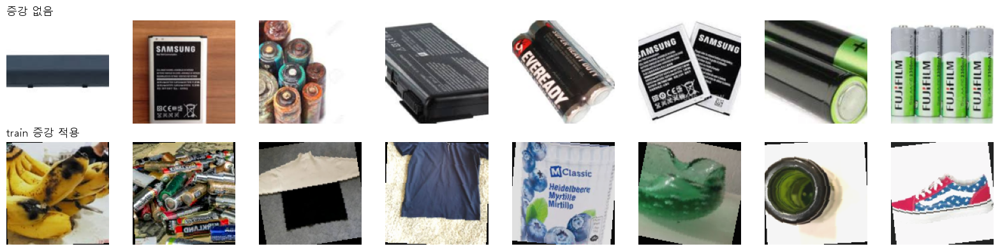

In [14]:
# 증강 적용 전후 비교: train(증강 적용) vs eval(증강 없음) 배치 시각화
def denorm(img_t):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return (img_t * std + mean).clamp(0, 1)

xb, yb = next(iter(train_loader))
xb_eval, _ = next(iter(DataLoader(ManifestDataset([paths[i] for i in train_idx[:8]],
                                                  targets[train_idx[:8]], transform=eval_tf),
                                  batch_size=8)))

fig, axes = plt.subplots(2, 8, figsize=(16, 4))
for i in range(8):
    axes[0, i].imshow(denorm(xb_eval[i]).permute(1, 2, 0).numpy())
    axes[0, i].axis('off')
    axes[1, i].imshow(denorm(xb[i]).permute(1, 2, 0).numpy())
    axes[1, i].axis('off')
axes[0, 0].set_title('증강 없음', loc='left')
axes[1, 0].set_title('train 증강 적용', loc='left')
plt.tight_layout()
plt.show()


## 5. 모델링 — 베이스라인 CNN vs 전이학습(EfficientNetV2-S, freeze/unfreeze)

In [15]:
# 베이스라인: 처음부터 학습하는 얕은 CNN
def conv_block(in_ch, out_ch):
    return [
        nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_ch),
        nn.ReLU(inplace=True)]

class BaselineCNN(nn.Module):
    def __init__(self, num_classes=12):
        super().__init__()
        self.features = nn.Sequential(
            *conv_block(3, 32), nn.MaxPool2d(2),
            *conv_block(32, 64), nn.MaxPool2d(2),
            *conv_block(64, 128), nn.MaxPool2d(2),
            *conv_block(128, 256), nn.MaxPool2d(2))
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes))

    def forward(self, x):
        return self.classifier(self.features(x))

summarize(BaselineCNN(num_classes=len(class_names)), 'BaselineCNN')


BaselineCNN - 전체 파라미터: 392,460 / 학습 파라미터: 392,460


In [16]:
EPOCHS_BASE = 30  # 조기 종료가 있으므로 상한을 넉넉히 잡는다

baseline_model = BaselineCNN(num_classes=len(class_names))
baseline_history = train_model(baseline_model, train_loader, val_loader,
                               epochs=EPOCHS_BASE, lr=1e-3, patience=5,
                               class_weights=class_weights if use_class_weight_final else None,
                               ckpt_path='best_baseline_cnn_v3.pt', label='BaselineCNN')


[BaselineCNN] Epoch 1/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 1/30 (27.4s) train_loss=1.6667 train_acc=0.4470 val_loss=1.5222 val_acc=0.5013 val_macro_f1=0.4647 val_macro_recall=0.5318


[BaselineCNN] Epoch 2/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 2/30 (28.5s) train_loss=1.4550 train_acc=0.5197 val_loss=1.4420 val_acc=0.5151 val_macro_f1=0.4904 val_macro_recall=0.5530


[BaselineCNN] Epoch 3/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 3/30 (28.3s) train_loss=1.3511 train_acc=0.5468 val_loss=1.3261 val_acc=0.5595 val_macro_f1=0.5329 val_macro_recall=0.5820


[BaselineCNN] Epoch 4/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 4/30 (27.5s) train_loss=1.3079 train_acc=0.5636 val_loss=1.2183 val_acc=0.6018 val_macro_f1=0.5622 val_macro_recall=0.6084


[BaselineCNN] Epoch 5/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 5/30 (28.2s) train_loss=1.2466 train_acc=0.5850 val_loss=1.2537 val_acc=0.5992 val_macro_f1=0.5529 val_macro_recall=0.6014


[BaselineCNN] Epoch 6/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 6/30 (27.7s) train_loss=1.2090 train_acc=0.5938 val_loss=1.3585 val_acc=0.5600 val_macro_f1=0.5465 val_macro_recall=0.6146


[BaselineCNN] Epoch 7/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 7/30 (27.4s) train_loss=1.1572 train_acc=0.6182 val_loss=1.0856 val_acc=0.6355 val_macro_f1=0.5878 val_macro_recall=0.6175


[BaselineCNN] Epoch 8/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 8/30 (27.3s) train_loss=1.1429 train_acc=0.6223 val_loss=1.2458 val_acc=0.5958 val_macro_f1=0.5769 val_macro_recall=0.6239


[BaselineCNN] Epoch 9/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 9/30 (28.6s) train_loss=1.1110 train_acc=0.6270 val_loss=1.0904 val_acc=0.6549 val_macro_f1=0.6391 val_macro_recall=0.6768


[BaselineCNN] Epoch 10/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 10/30 (27.6s) train_loss=1.0817 train_acc=0.6383 val_loss=0.9618 val_acc=0.6946 val_macro_f1=0.6521 val_macro_recall=0.6639


[BaselineCNN] Epoch 11/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 11/30 (27.4s) train_loss=1.0657 train_acc=0.6456 val_loss=1.0728 val_acc=0.6432 val_macro_f1=0.6063 val_macro_recall=0.6507


[BaselineCNN] Epoch 12/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 12/30 (27.6s) train_loss=1.0506 train_acc=0.6483 val_loss=1.1177 val_acc=0.6368 val_macro_f1=0.6103 val_macro_recall=0.6714


[BaselineCNN] Epoch 13/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 13/30 (27.5s) train_loss=1.0201 train_acc=0.6583 val_loss=1.0743 val_acc=0.6398 val_macro_f1=0.6066 val_macro_recall=0.6590


[BaselineCNN] Epoch 14/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 14/30 (27.4s) train_loss=1.0085 train_acc=0.6619 val_loss=1.1787 val_acc=0.6079 val_macro_f1=0.6019 val_macro_recall=0.6451


[BaselineCNN] Epoch 15/30:   0%|          | 0/170 [00:00<?, ?it/s]

[BaselineCNN] Epoch 15/30 (27.4s) train_loss=0.9769 train_acc=0.6704 val_loss=1.1529 val_acc=0.6130 val_macro_f1=0.5920 val_macro_recall=0.6552
[BaselineCNN] val_macro_f1이 5 epoch 동안 개선되지 않아 15/30 epoch에서 조기 종료


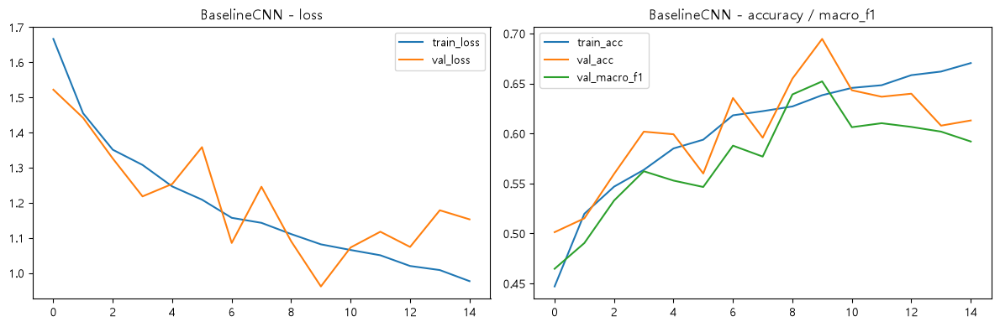

In [17]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(baseline_history['loss'], label='train_loss')
plt.plot(baseline_history['val_loss'], label='val_loss')
plt.title('BaselineCNN - loss'); plt.legend()
plt.subplot(1, 2, 2)
plt.plot(baseline_history['accuracy'], label='train_acc')
plt.plot(baseline_history['val_accuracy'], label='val_acc')
plt.plot(baseline_history['val_macro_f1'], label='val_macro_f1')
plt.title('BaselineCNN - accuracy / macro_f1'); plt.legend()
plt.tight_layout()
plt.show()


In [18]:
EPOCHS_TRANSFER = 20  # 조기 종료가 있으므로 상한을 넉넉히 잡는다

transfer_model = TransferModel(num_classes=len(class_names), freeze=True)
transfer_history = train_model(transfer_model, train_loader, val_loader,
                               epochs=EPOCHS_TRANSFER, lr=5e-4, patience=4,
                               class_weights=class_weights if use_class_weight_final else None,
                               ckpt_path='best_transfer_model_v3.pt', label='EfficientNetV2S(freeze)')


[EfficientNetV2S(freeze)] Epoch 1/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 1/20 (30.3s) train_loss=1.6317 train_acc=0.5754 val_loss=0.9908 val_acc=0.7955 val_macro_f1=0.7121 val_macro_recall=0.7250


[EfficientNetV2S(freeze)] Epoch 2/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 2/20 (30.9s) train_loss=1.0544 train_acc=0.7051 val_loss=0.7663 val_acc=0.8154 val_macro_f1=0.7398 val_macro_recall=0.7482


[EfficientNetV2S(freeze)] Epoch 3/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 3/20 (30.9s) train_loss=0.8997 train_acc=0.7398 val_loss=0.6698 val_acc=0.8305 val_macro_f1=0.7590 val_macro_recall=0.7717


[EfficientNetV2S(freeze)] Epoch 4/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 4/20 (30.7s) train_loss=0.8542 train_acc=0.7462 val_loss=0.6426 val_acc=0.8408 val_macro_f1=0.7776 val_macro_recall=0.7896


[EfficientNetV2S(freeze)] Epoch 5/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 5/20 (30.7s) train_loss=0.8053 train_acc=0.7547 val_loss=0.5776 val_acc=0.8447 val_macro_f1=0.7821 val_macro_recall=0.7894


[EfficientNetV2S(freeze)] Epoch 6/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 6/20 (30.9s) train_loss=0.7762 train_acc=0.7646 val_loss=0.5733 val_acc=0.8473 val_macro_f1=0.7847 val_macro_recall=0.7955


[EfficientNetV2S(freeze)] Epoch 7/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 7/20 (31.0s) train_loss=0.7598 train_acc=0.7653 val_loss=0.5432 val_acc=0.8529 val_macro_f1=0.7933 val_macro_recall=0.8002


[EfficientNetV2S(freeze)] Epoch 8/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 8/20 (30.8s) train_loss=0.7361 train_acc=0.7708 val_loss=0.5445 val_acc=0.8568 val_macro_f1=0.7971 val_macro_recall=0.8061


[EfficientNetV2S(freeze)] Epoch 9/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 9/20 (30.8s) train_loss=0.7433 train_acc=0.7713 val_loss=0.5244 val_acc=0.8542 val_macro_f1=0.7903 val_macro_recall=0.7992


[EfficientNetV2S(freeze)] Epoch 10/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 10/20 (30.9s) train_loss=0.7562 train_acc=0.7652 val_loss=0.5158 val_acc=0.8650 val_macro_f1=0.8089 val_macro_recall=0.8162


[EfficientNetV2S(freeze)] Epoch 11/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 11/20 (31.0s) train_loss=0.7143 train_acc=0.7761 val_loss=0.5110 val_acc=0.8598 val_macro_f1=0.8029 val_macro_recall=0.8106


[EfficientNetV2S(freeze)] Epoch 12/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 12/20 (31.9s) train_loss=0.7124 train_acc=0.7791 val_loss=0.5110 val_acc=0.8563 val_macro_f1=0.7972 val_macro_recall=0.8088


[EfficientNetV2S(freeze)] Epoch 13/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 13/20 (31.3s) train_loss=0.7221 train_acc=0.7745 val_loss=0.4999 val_acc=0.8598 val_macro_f1=0.8001 val_macro_recall=0.8073


[EfficientNetV2S(freeze)] Epoch 14/20:   0%|          | 0/170 [00:00<?, ?it/s]

[EfficientNetV2S(freeze)] Epoch 14/20 (31.1s) train_loss=0.6976 train_acc=0.7848 val_loss=0.4920 val_acc=0.8628 val_macro_f1=0.8053 val_macro_recall=0.8113
[EfficientNetV2S(freeze)] val_macro_f1이 4 epoch 동안 개선되지 않아 14/20 epoch에서 조기 종료


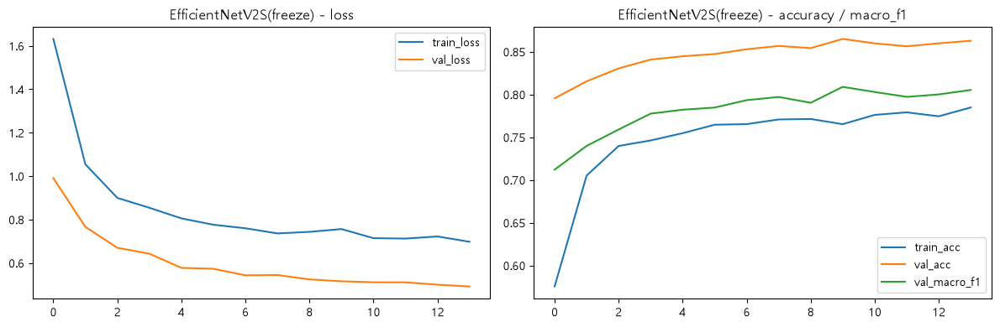

In [19]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(transfer_history['loss'], label='train_loss')
plt.plot(transfer_history['val_loss'], label='val_loss')
plt.title('EfficientNetV2S(freeze) - loss'); plt.legend()
plt.subplot(1, 2, 2)
plt.plot(transfer_history['accuracy'], label='train_acc')
plt.plot(transfer_history['val_accuracy'], label='val_acc')
plt.plot(transfer_history['val_macro_f1'], label='val_macro_f1')
plt.title('EfficientNetV2S(freeze) - accuracy / macro_f1'); plt.legend()
plt.tight_layout()
plt.show()


### 5-1. 전이학습(unfreeze) 학습률 비교 — 정제 데이터로 재탐색 (val 기준)

**시행착오**: 처음엔 `appendix/A2_label_error_detection.ipynb`처럼 스케줄러 없이 짧게(4epoch) 스윕해서 lr 하나를 고르고 그 값으로만 최종(15epoch+스케줄러+조기종료) 학습을 했다. 그 결과 4epoch 스윕에서는 `1e-4`(val_macro_f1 0.9629)가 `5e-5`(0.9538)를 앞섰지만, 그 lr로 실제 최종 학습을 돌리자 조기 종료(patience=3)가 스케줄러가 개입하기도 전인 6epoch째 발동해 최종 val_macro_f1이 0.9652에 그쳤다 — `appendix/A2_label_error_detection.ipynb`에서 `5e-5`로 15epoch 다 채워 스케줄러 혜택까지 받은 결과(0.9680)보다 오히려 낮았다. 즉 **짧은 스윕 순위가 실제 최종 학습(조기종료+스케줄러 포함) 결과를 보장하지 않는다는 게 재현됐다.**

그래서 이번엔 미니 스윕을 아예 없애고, **lr 후보 3개를 전부 최종 설정 그대로(scheduler + 조기종료, 최대 15epoch) 끝까지 학습**한 뒤, 다음 절에서 베이스라인·freeze와 함께 검증 macro F1으로 직접 비교해서 고른다.

In [20]:
UNFREEZE_LR_CANDIDATES = [5e-5, 1e-4, 3e-4]
EPOCHS_TRANSFER_UNFREEZE = 15  # 조기 종료가 있으므로 상한을 넉넉히 잡는다

# 학습률 스케줄러(ReduceLROnPlateau): val_loss가 1epoch 동안 개선 안 되면 lr을 0.1배로 낮춘다
unfreeze_histories = {}
for lr in UNFREEZE_LR_CANDIDATES:
    model = TransferModel(num_classes=len(class_names), freeze=False)
    history = train_model(model, train_loader, val_loader,
                          epochs=EPOCHS_TRANSFER_UNFREEZE, lr=lr, patience=3,
                          use_scheduler=True, scheduler_patience=1,
                          class_weights=class_weights if use_class_weight_final else None,
                          ckpt_path=f'unfreeze_lr_{lr:.0e}_v3.pt', label=f'unfreeze lr={lr:.0e}')
    unfreeze_histories[lr] = history


[unfreeze lr=5e-05] Epoch 1/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 1/15 (53.7s) train_loss=1.3752 train_acc=0.6268 val_loss=0.3192 val_acc=0.9254 val_macro_f1=0.8988 val_macro_recall=0.9003 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 2/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 2/15 (53.3s) train_loss=0.3217 train_acc=0.9090 val_loss=0.1539 val_acc=0.9573 val_macro_f1=0.9419 val_macro_recall=0.9396 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 3/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 3/15 (53.9s) train_loss=0.1776 train_acc=0.9493 val_loss=0.1182 val_acc=0.9668 val_macro_f1=0.9538 val_macro_recall=0.9523 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 4/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 4/15 (53.2s) train_loss=0.1282 train_acc=0.9618 val_loss=0.1105 val_acc=0.9668 val_macro_f1=0.9528 val_macro_recall=0.9540 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 5/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 5/15 (53.4s) train_loss=0.1004 train_acc=0.9709 val_loss=0.1033 val_acc=0.9702 val_macro_f1=0.9566 val_macro_recall=0.9567 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 6/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 6/15 (54.1s) train_loss=0.0735 train_acc=0.9782 val_loss=0.1010 val_acc=0.9702 val_macro_f1=0.9587 val_macro_recall=0.9577 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 7/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 7/15 (53.3s) train_loss=0.0590 train_acc=0.9829 val_loss=0.0927 val_acc=0.9715 val_macro_f1=0.9584 val_macro_recall=0.9580 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 8/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 8/15 (53.3s) train_loss=0.0490 train_acc=0.9858 val_loss=0.0950 val_acc=0.9733 val_macro_f1=0.9616 val_macro_recall=0.9608 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 9/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 9/15 (53.4s) train_loss=0.0420 train_acc=0.9877 val_loss=0.0896 val_acc=0.9733 val_macro_f1=0.9628 val_macro_recall=0.9624 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 10/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 10/15 (53.5s) train_loss=0.0322 train_acc=0.9913 val_loss=0.0883 val_acc=0.9763 val_macro_f1=0.9660 val_macro_recall=0.9655 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 11/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 11/15 (53.4s) train_loss=0.0328 train_acc=0.9907 val_loss=0.0852 val_acc=0.9750 val_macro_f1=0.9640 val_macro_recall=0.9642 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 12/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 12/15 (53.4s) train_loss=0.0348 train_acc=0.9896 val_loss=0.0866 val_acc=0.9780 val_macro_f1=0.9686 val_macro_recall=0.9681 lr=5.0e-05


[unfreeze lr=5e-05] Epoch 13/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 13/15 (53.4s) train_loss=0.0290 train_acc=0.9913 val_loss=0.0898 val_acc=0.9767 val_macro_f1=0.9670 val_macro_recall=0.9656 lr=5.0e-06


[unfreeze lr=5e-05] Epoch 14/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 14/15 (54.2s) train_loss=0.0206 train_acc=0.9935 val_loss=0.0873 val_acc=0.9767 val_macro_f1=0.9667 val_macro_recall=0.9648 lr=5.0e-06


[unfreeze lr=5e-05] Epoch 15/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=5e-05] Epoch 15/15 (53.1s) train_loss=0.0246 train_acc=0.9930 val_loss=0.0869 val_acc=0.9806 val_macro_f1=0.9731 val_macro_recall=0.9718 lr=5.0e-07


[unfreeze lr=1e-04] Epoch 1/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=1e-04] Epoch 1/15 (54.4s) train_loss=0.9847 train_acc=0.7279 val_loss=0.1899 val_acc=0.9448 val_macro_f1=0.9221 val_macro_recall=0.9221 lr=1.0e-04


[unfreeze lr=1e-04] Epoch 2/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=1e-04] Epoch 2/15 (53.8s) train_loss=0.2059 train_acc=0.9372 val_loss=0.1281 val_acc=0.9633 val_macro_f1=0.9465 val_macro_recall=0.9463 lr=1.0e-04


[unfreeze lr=1e-04] Epoch 3/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=1e-04] Epoch 3/15 (53.2s) train_loss=0.1284 train_acc=0.9620 val_loss=0.0925 val_acc=0.9707 val_macro_f1=0.9580 val_macro_recall=0.9583 lr=1.0e-04


[unfreeze lr=1e-04] Epoch 4/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=1e-04] Epoch 4/15 (53.1s) train_loss=0.0870 train_acc=0.9754 val_loss=0.1183 val_acc=0.9612 val_macro_f1=0.9437 val_macro_recall=0.9431 lr=1.0e-04


[unfreeze lr=1e-04] Epoch 5/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=1e-04] Epoch 5/15 (53.0s) train_loss=0.0694 train_acc=0.9795 val_loss=0.1081 val_acc=0.9707 val_macro_f1=0.9563 val_macro_recall=0.9555 lr=1.0e-05


[unfreeze lr=1e-04] Epoch 6/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=1e-04] Epoch 6/15 (53.3s) train_loss=0.0518 train_acc=0.9846 val_loss=0.0940 val_acc=0.9737 val_macro_f1=0.9600 val_macro_recall=0.9604 lr=1.0e-05


[unfreeze lr=1e-04] Epoch 7/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=1e-04] Epoch 7/15 (53.0s) train_loss=0.0445 train_acc=0.9863 val_loss=0.0930 val_acc=0.9720 val_macro_f1=0.9585 val_macro_recall=0.9587 lr=1.0e-06


[unfreeze lr=1e-04] Epoch 8/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=1e-04] Epoch 8/15 (53.1s) train_loss=0.0392 train_acc=0.9875 val_loss=0.0956 val_acc=0.9711 val_macro_f1=0.9571 val_macro_recall=0.9563 lr=1.0e-06


[unfreeze lr=1e-04] Epoch 9/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=1e-04] Epoch 9/15 (53.4s) train_loss=0.0362 train_acc=0.9896 val_loss=0.0950 val_acc=0.9728 val_macro_f1=0.9597 val_macro_recall=0.9595 lr=1.0e-07
[unfreeze lr=1e-04] val_macro_f1이 3 epoch 동안 개선되지 않아 9/15 epoch에서 조기 종료


[unfreeze lr=3e-04] Epoch 1/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 1/15 (53.4s) train_loss=0.5283 train_acc=0.8429 val_loss=0.1744 val_acc=0.9435 val_macro_f1=0.9237 val_macro_recall=0.9270 lr=3.0e-04


[unfreeze lr=3e-04] Epoch 2/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 2/15 (53.1s) train_loss=0.1827 train_acc=0.9441 val_loss=0.1419 val_acc=0.9582 val_macro_f1=0.9385 val_macro_recall=0.9409 lr=3.0e-04


[unfreeze lr=3e-04] Epoch 3/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 3/15 (53.0s) train_loss=0.1220 train_acc=0.9631 val_loss=0.1664 val_acc=0.9547 val_macro_f1=0.9374 val_macro_recall=0.9394 lr=3.0e-04


[unfreeze lr=3e-04] Epoch 4/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 4/15 (53.3s) train_loss=0.1038 train_acc=0.9678 val_loss=0.1044 val_acc=0.9676 val_macro_f1=0.9557 val_macro_recall=0.9573 lr=3.0e-04


[unfreeze lr=3e-04] Epoch 5/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 5/15 (53.2s) train_loss=0.0937 train_acc=0.9714 val_loss=0.1144 val_acc=0.9629 val_macro_f1=0.9486 val_macro_recall=0.9494 lr=3.0e-04


[unfreeze lr=3e-04] Epoch 6/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 6/15 (53.0s) train_loss=0.0761 train_acc=0.9766 val_loss=0.1276 val_acc=0.9612 val_macro_f1=0.9482 val_macro_recall=0.9484 lr=3.0e-05


[unfreeze lr=3e-04] Epoch 7/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 7/15 (53.4s) train_loss=0.0483 train_acc=0.9856 val_loss=0.1027 val_acc=0.9702 val_macro_f1=0.9575 val_macro_recall=0.9561 lr=3.0e-05


[unfreeze lr=3e-04] Epoch 8/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 8/15 (53.7s) train_loss=0.0319 train_acc=0.9910 val_loss=0.1077 val_acc=0.9689 val_macro_f1=0.9547 val_macro_recall=0.9540 lr=3.0e-05


[unfreeze lr=3e-04] Epoch 9/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 9/15 (53.1s) train_loss=0.0288 train_acc=0.9919 val_loss=0.0875 val_acc=0.9741 val_macro_f1=0.9617 val_macro_recall=0.9598 lr=3.0e-05


[unfreeze lr=3e-04] Epoch 10/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 10/15 (53.2s) train_loss=0.0199 train_acc=0.9946 val_loss=0.0895 val_acc=0.9767 val_macro_f1=0.9658 val_macro_recall=0.9651 lr=3.0e-05


[unfreeze lr=3e-04] Epoch 11/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 11/15 (53.9s) train_loss=0.0196 train_acc=0.9943 val_loss=0.0871 val_acc=0.9754 val_macro_f1=0.9634 val_macro_recall=0.9617 lr=3.0e-05


[unfreeze lr=3e-04] Epoch 12/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 12/15 (54.0s) train_loss=0.0181 train_acc=0.9939 val_loss=0.0874 val_acc=0.9750 val_macro_f1=0.9623 val_macro_recall=0.9611 lr=3.0e-05


[unfreeze lr=3e-04] Epoch 13/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze lr=3e-04] Epoch 13/15 (53.3s) train_loss=0.0145 train_acc=0.9947 val_loss=0.0885 val_acc=0.9750 val_macro_f1=0.9639 val_macro_recall=0.9636 lr=3.0e-06
[unfreeze lr=3e-04] val_macro_f1이 3 epoch 동안 개선되지 않아 13/15 epoch에서 조기 종료


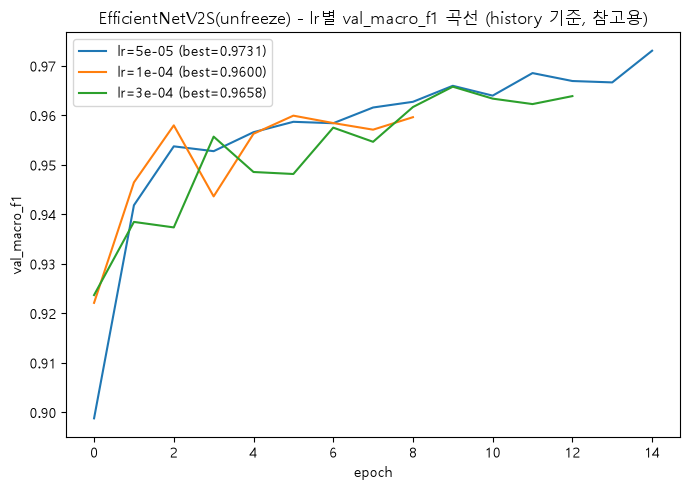

In [21]:
plt.figure(figsize=(7, 5))
for lr, history in unfreeze_histories.items():
    plt.plot(history['val_macro_f1'], label=f'lr={lr:.0e} (best={max(history["val_macro_f1"]):.4f})')
plt.xlabel('epoch'); plt.ylabel('val_macro_f1')
plt.title('EfficientNetV2S(unfreeze) - lr별 val_macro_f1 곡선 (history 기준, 참고용)')
plt.legend()
plt.tight_layout()
plt.show()


### 5-2. 증강 효과 검증 (증강 있음 vs 없음)

최종 모델(unfreeze, lr=5e-5)과 **완전히 동일한 조건**(비율유지크롭+`WeightedRandomSampler`+스케줄러+patience 3, 최대 15epoch)에서 train transform만 증강 없이(eval_tf와 동일)로 바꿔 별도로 학습한다. 목적은 증강이 실제로 기여했는지를 이 노트북 밖(팀 통합 분석 노트북)에서 통계적으로 검정하기 위한 비교 대상 모델을 만드는 것이다.

**결과**: 증강 없음 val_macro_f1 **0.9595** (증강 있음 0.9731 대비 -0.0136, 15epoch 전부 소진). test 확률(`probs_test_noaug.npy`)까지 뽑아 `03_Team_Analysis.ipynb`의 "검정 5"에서 두 모델을 test에서 직접 짝지어 비교한 결과, val에서 보인 차이(0.0136)가 test에서는 0.0055로 줄고 부트스트랩 95% CI가 0을 포함해 **통계적으로 유의하지 않았다**(상세: `docs/02_notes.md`의 "증강 효과 검증" 절).


In [22]:
# 증강 효과 검증용: train transform을 eval_tf(증강 없음, 리사이즈+정규화만)로 바꾸고
# 나머지(비율유지크롭+WeightedRandomSampler+unfreeze+lr 5e-5+스케줄러+patience3+최대15epoch)는
# 최종 모델(unfreeze_lr_5e-05_v3.pt)과 완전히 동일하게 유지한다.
_, _, _, train_loader_noaug, val_loader_noaug, test_loader_noaug = make_loaders(
    eval_tf, eval_tf, use_sampler_final)

noaug_model = TransferModel(num_classes=len(class_names), freeze=False)
noaug_history = train_model(noaug_model, train_loader_noaug, val_loader_noaug,
                             epochs=15, lr=5e-5, patience=3,
                             use_scheduler=True, scheduler_patience=1,
                             class_weights=class_weights if use_class_weight_final else None,
                             ckpt_path='unfreeze_lr_5e-05_noaug_v3.pt',
                             label='unfreeze noaug lr=5e-05')

print('\n증강 없음 최고 val_macro_f1:', max(noaug_history['val_macro_f1']))


[unfreeze noaug lr=5e-05] Epoch 1/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 1/15 (51.4s) train_loss=1.2083 train_acc=0.6925 val_loss=0.2846 val_acc=0.9284 val_macro_f1=0.8989 val_macro_recall=0.9008 lr=5.0e-05


[unfreeze noaug lr=5e-05] Epoch 2/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 2/15 (50.5s) train_loss=0.2207 train_acc=0.9447 val_loss=0.1513 val_acc=0.9551 val_macro_f1=0.9376 val_macro_recall=0.9396 lr=5.0e-05


[unfreeze noaug lr=5e-05] Epoch 3/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 3/15 (47.7s) train_loss=0.0912 train_acc=0.9751 val_loss=0.1161 val_acc=0.9659 val_macro_f1=0.9513 val_macro_recall=0.9511 lr=5.0e-05


[unfreeze noaug lr=5e-05] Epoch 4/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 4/15 (46.5s) train_loss=0.0546 train_acc=0.9867 val_loss=0.1032 val_acc=0.9685 val_macro_f1=0.9546 val_macro_recall=0.9539 lr=5.0e-05


[unfreeze noaug lr=5e-05] Epoch 5/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 5/15 (46.5s) train_loss=0.0333 train_acc=0.9923 val_loss=0.1099 val_acc=0.9685 val_macro_f1=0.9542 val_macro_recall=0.9545 lr=5.0e-05


[unfreeze noaug lr=5e-05] Epoch 6/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 6/15 (46.6s) train_loss=0.0259 train_acc=0.9936 val_loss=0.1161 val_acc=0.9694 val_macro_f1=0.9562 val_macro_recall=0.9565 lr=5.0e-06


[unfreeze noaug lr=5e-05] Epoch 7/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 7/15 (46.6s) train_loss=0.0223 train_acc=0.9948 val_loss=0.1110 val_acc=0.9715 val_macro_f1=0.9585 val_macro_recall=0.9595 lr=5.0e-06


[unfreeze noaug lr=5e-05] Epoch 8/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 8/15 (46.4s) train_loss=0.0160 train_acc=0.9959 val_loss=0.1156 val_acc=0.9689 val_macro_f1=0.9550 val_macro_recall=0.9550 lr=5.0e-07


[unfreeze noaug lr=5e-05] Epoch 9/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 9/15 (46.5s) train_loss=0.0168 train_acc=0.9962 val_loss=0.1089 val_acc=0.9702 val_macro_f1=0.9577 val_macro_recall=0.9581 lr=5.0e-07


[unfreeze noaug lr=5e-05] Epoch 10/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 10/15 (46.4s) train_loss=0.0218 train_acc=0.9946 val_loss=0.1090 val_acc=0.9720 val_macro_f1=0.9591 val_macro_recall=0.9579 lr=1.0e-07


[unfreeze noaug lr=5e-05] Epoch 11/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 11/15 (46.4s) train_loss=0.0185 train_acc=0.9960 val_loss=0.1117 val_acc=0.9702 val_macro_f1=0.9568 val_macro_recall=0.9558 lr=1.0e-07


[unfreeze noaug lr=5e-05] Epoch 12/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 12/15 (46.3s) train_loss=0.0185 train_acc=0.9960 val_loss=0.1065 val_acc=0.9711 val_macro_f1=0.9582 val_macro_recall=0.9571 lr=1.0e-07


[unfreeze noaug lr=5e-05] Epoch 13/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 13/15 (46.4s) train_loss=0.0174 train_acc=0.9961 val_loss=0.1039 val_acc=0.9720 val_macro_f1=0.9592 val_macro_recall=0.9586 lr=1.0e-07


[unfreeze noaug lr=5e-05] Epoch 14/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 14/15 (46.5s) train_loss=0.0190 train_acc=0.9957 val_loss=0.1114 val_acc=0.9724 val_macro_f1=0.9595 val_macro_recall=0.9594 lr=1.0e-07


[unfreeze noaug lr=5e-05] Epoch 15/15:   0%|          | 0/170 [00:00<?, ?it/s]

[unfreeze noaug lr=5e-05] Epoch 15/15 (46.3s) train_loss=0.0156 train_acc=0.9966 val_loss=0.1074 val_acc=0.9720 val_macro_f1=0.9592 val_macro_recall=0.9583 lr=1.0e-07

증강 없음 최고 val_macro_f1: 0.9595492255941469


## 6. 검증 성능 비교 및 최종 모델 선정 — v3(128px) 기준

> **버전 안내**: 이 절과 아래 7~9절은 **v3(128px, lr 5e-5)** 시점의 기록이다.
> 아키텍처(EfficientNetV2-S unfreeze)와 불균형 대응 방식을 고른 근거로서 유효하다.
> **해상도와 학습률은 11 · 11-1절에서 다시 선택했고, 최종 모델 기준 재평가는 12절에 있다.**

조기 종료를 쓰면 마지막 epoch이 최고 성능이 아닐 수 있으므로, `history`의 마지막 값이 아니라 저장된 best 체크포인트를 다시 불러와 `val_loader`로 평가한다. 베이스라인·freeze·unfreeze(lr 3종) 총 5개 후보를 전부 이 방식으로 비교해 최종 모델을 고른다 — 모델 구조와 하이퍼파라미터(lr)를 같은 기준(검증 macro F1)으로 한 번에 비교하는 것.

In [23]:
candidate_specs = [
    ("BaselineCNN", "best_baseline_cnn_v3.pt",
     lambda: BaselineCNN(num_classes=len(class_names))),
    ("EfficientNetV2S(freeze)", "best_transfer_model_v3.pt",
     lambda: TransferModel(num_classes=len(class_names), freeze=True)),
] + [
    (f"EfficientNetV2S(unfreeze lr={lr:.0e})", f"unfreeze_lr_{lr:.0e}_v3.pt",
     lambda: TransferModel(num_classes=len(class_names), freeze=False))
    for lr in UNFREEZE_LR_CANDIDATES
]

criterion = nn.CrossEntropyLoss(weight=class_weights if use_class_weight_final else None)

print(f'{"모델":32s}{"val_loss":>10s}{"val_acc":>10s}{"val_macro_f1":>14s}{"val_macro_recall":>18s}')
candidates = []
for name, ckpt, builder in candidate_specs:
    model = builder()
    model.load_state_dict(torch.load(ckpt, map_location=device))
    model = model.to(device)
    m = evaluate(model, val_loader, criterion)
    print(f'{name:32s}{m["loss"]:10.4f}{m["accuracy"]:10.4f}'
          f'{m["macro_f1"]:14.4f}{m["macro_recall"]:18.4f}')
    candidates.append((name, m, ckpt, model))

best_name, best_val_metrics, best_ckpt, best_model = max(candidates, key=lambda x: x[1]['macro_f1'])
print(f'\n검증 macro F1 기준 최종 선정 모델: {best_name}')


모델                                val_loss   val_acc  val_macro_f1  val_macro_recall


BaselineCNN                         0.9618    0.6946        0.6521            0.6639


EfficientNetV2S(freeze)             0.5158    0.8650        0.8089            0.8162


EfficientNetV2S(unfreeze lr=5e-05)    0.0869    0.9806        0.9731            0.9718


EfficientNetV2S(unfreeze lr=1e-04)    0.0940    0.9737        0.9600            0.9604


EfficientNetV2S(unfreeze lr=3e-04)    0.0895    0.9767        0.9658            0.9651

검증 macro F1 기준 최종 선정 모델: EfficientNetV2S(unfreeze lr=5e-05)


## 7. test 평가 — v3(128px) 시점

> 이 절의 수치(accuracy 0.9773 / macro-F1 0.9671)는 **v3 시점의 test 결과**다.
> 최종 채택 모델 v5(224px, lr 1e-4)의 test 결과는 **12절**에 있다.

In [24]:
test_metrics = evaluate(best_model, test_loader)
print(f'[TEST / {best_name}] accuracy={test_metrics["accuracy"]:.4f} '
      f'macro_f1={test_metrics["macro_f1"]:.4f} macro_recall={test_metrics["macro_recall"]:.4f}')
print()
print(classification_report(test_metrics['trues'], test_metrics['preds'],
                            target_names=class_names, zero_division=0))


[TEST / EfficientNetV2S(unfreeze lr=5e-05)] accuracy=0.9773 macro_f1=0.9671 macro_recall=0.9668

              precision    recall  f1-score   support

     battery       0.99      0.97      0.98       143
  biological       0.99      0.99      0.99       149
 brown-glass       0.95      0.98      0.96        92
   cardboard       0.99      0.93      0.96       135
     clothes       0.99      1.00      1.00       793
 green-glass       0.99      0.98      0.98        93
       metal       0.90      0.97      0.93       116
       paper       0.95      0.99      0.97       158
     plastic       0.92      0.90      0.91       130
       shoes       0.99      0.99      0.99       304
       trash       0.97      0.97      0.97       105
 white-glass       0.98      0.95      0.96       116

    accuracy                           0.98      2334
   macro avg       0.97      0.97      0.97      2334
weighted avg       0.98      0.98      0.98      2334



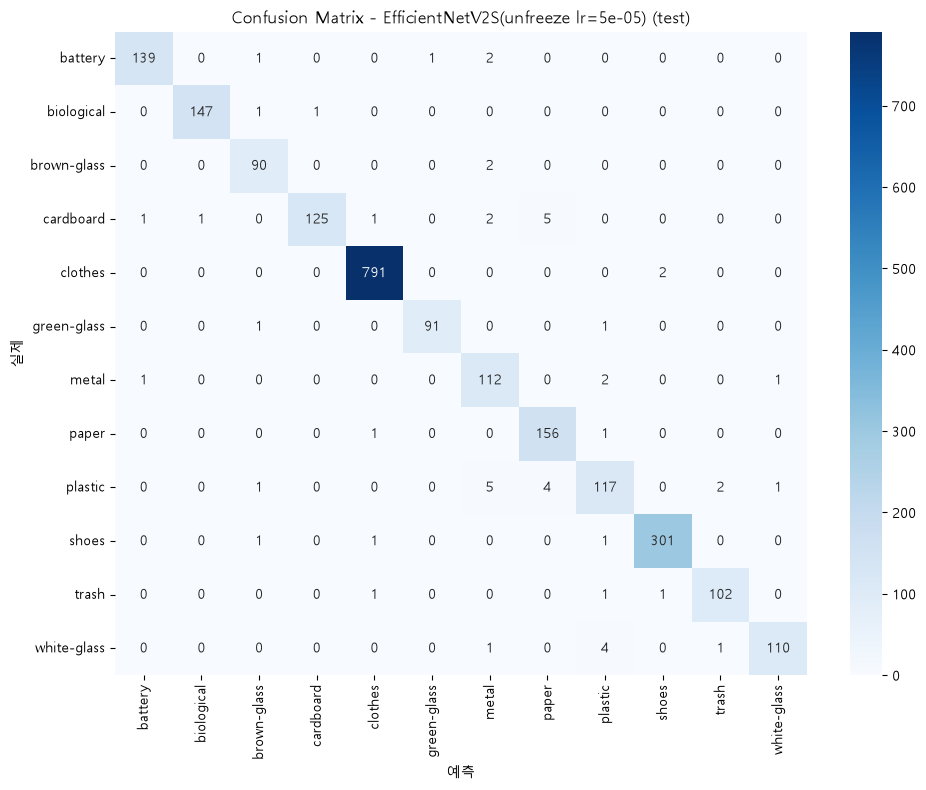

상위 오분류 쌍(실제->예측, 건수):
  cardboard -> paper: 5건
  plastic -> metal: 5건
  plastic -> paper: 4건
  white-glass -> plastic: 4건
  battery -> metal: 2건
  brown-glass -> metal: 2건
  cardboard -> metal: 2건
  clothes -> shoes: 2건
  metal -> plastic: 2건
  plastic -> trash: 2건


In [25]:
import seaborn as sns

cm = confusion_matrix(test_metrics['trues'], test_metrics['preds'])
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('예측'); plt.ylabel('실제')
plt.title(f'Confusion Matrix - {best_name} (test)')
plt.tight_layout()
plt.show()

# 상위 오분류 쌍
off_diag = cm.copy().astype(float)
np.fill_diagonal(off_diag, 0)
pairs = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and off_diag[i, j] > 0:
            pairs.append((class_names[i], class_names[j], int(off_diag[i, j])))
pairs.sort(key=lambda x: -x[2])
print('상위 오분류 쌍(실제->예측, 건수):')
for a, b, n in pairs[:10]:
    print(f'  {a} -> {b}: {n}건')


## 8. 결과 해석 — Grad-CAM

최종 선정 모델(`best_model`)에서 재학습 없이 바로 근거 영역을 시각화한다.

In [26]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx=None):
        self.model.eval()
        x = x.clone().requires_grad_(True)
        logits = self.model(x)
        if class_idx is None:
            class_idx = logits.argmax(dim=1)

        self.model.zero_grad()
        score = logits[torch.arange(len(logits)), class_idx].sum()
        score.backward()

        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * self.activations).sum(dim=1)
        cam = F.relu(cam)
        cam = cam / (cam.amax(dim=(1, 2), keepdim=True) + 1e-8)
        return cam.cpu().numpy(), class_idx.cpu().numpy(), logits.softmax(dim=1).detach().cpu().numpy()


target_layer = best_model.features[-1] if hasattr(best_model, 'features') else None
gradcam = GradCAM(best_model, target_layer)


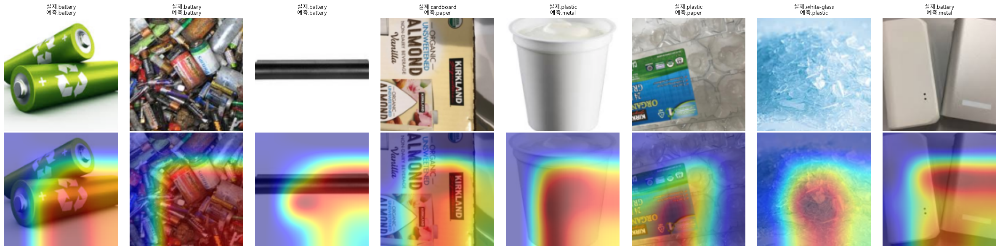

In [27]:
# 무작위 배치 대신, 잘 맞춘 예시 3장 + 위에서 확인한 상위 오분류 쌍 5장을 골라서 확인
preds, trues = test_metrics['preds'], test_metrics['trues']
correct_idx = np.where(preds == trues)[0][:3]

pair_idx = []
for a, b, _ in pairs[:5]:
    ai, bi = class_to_idx[a], class_to_idx[b]
    hit = np.where((trues == ai) & (preds == bi))[0]
    if len(hit) > 0:
        pair_idx.append(hit[0])

show_idx = list(correct_idx) + pair_idx
fig, axes = plt.subplots(2, len(show_idx), figsize=(3 * len(show_idx), 6))
for col, idx in enumerate(show_idx):
    img_t, label = test_set[idx]
    xb = img_t.unsqueeze(0).to(device)
    cam, pred_idx, probs = gradcam(xb)

    img_np = denorm(img_t).permute(1, 2, 0).numpy()
    cam_resized = np.array(Image.fromarray((cam[0] * 255).astype(np.uint8)).resize((IMAGE_SIZE, IMAGE_SIZE))) / 255.0

    axes[0, col].imshow(img_np)
    axes[0, col].set_title(f'실제:{class_names[label]}\n예측:{class_names[pred_idx[0]]}', fontsize=9)
    axes[0, col].axis('off')

    axes[1, col].imshow(img_np)
    axes[1, col].imshow(cam_resized, cmap='jet', alpha=0.5)
    axes[1, col].axis('off')

plt.tight_layout()
plt.show()


## 9. test 오분류 전수 확인 (확신도 기준, 이미지)

최종 test 평가에서 나온 오분류를 확신도(softmax 확률) 내림차순으로 전부 이미지로 직접 확인한다. `appendix/A2_label_error_detection.ipynb`의 5-1/5-2와 같은 목적 — 진짜 헷갈리는 사진인지, 아직 못 잡은 라벨 오류인지 판단.

In [28]:
@torch.no_grad()
def get_probs(model, loader):
    model.eval()
    probs_all = []
    for xb, yb in loader:
        xb = xb.to(device)
        probs = F.softmax(model(xb), dim=1)
        probs_all.append(probs.cpu().numpy())
    return np.concatenate(probs_all)

test_probs = get_probs(best_model, test_loader)
test_preds_all = test_probs.argmax(axis=1)
test_conf = test_probs.max(axis=1)
test_trues_all = np.array(test_set.targets)

wrong_mask = test_preds_all != test_trues_all
wrong_pos = np.where(wrong_mask)[0]
order = wrong_pos[np.argsort(-test_conf[wrong_pos])]

print(f'test {len(test_set)}장 중 오분류 {wrong_mask.sum()}건, 확신도 내림차순 전수 확인')
print(f'\n{"#":>3s} {"실제":12s} {"예측":12s} {"확신도":>6s}  파일명')
for rank, pos in enumerate(order, 1):
    fname = os.path.basename(test_set.paths[pos])
    print(f'{rank:3d} {class_names[test_trues_all[pos]]:12s} {class_names[test_preds_all[pos]]:12s} '
          f'{test_conf[pos]:6.3f}  {fname}')


test 2334장 중 오분류 53건, 확신도 내림차순 전수 확인

  # 실제           예측              확신도  파일명
  1 brown-glass  metal         0.999  brown-glass247.jpg
  2 plastic      metal         0.998  plastic16.jpg
  3 paper        plastic       0.997  paper8.jpg
  4 cardboard    paper         0.996  cardboard442.jpg
  5 trash        clothes       0.992  trash548.jpg
  6 cardboard    paper         0.984  cardboard178.jpg
  7 clothes      shoes         0.982  clothes913.jpg
  8 plastic      trash         0.979  plastic540.jpg
  9 trash        shoes         0.975  trash640.jpg
 10 metal        battery       0.969  metal676.jpg
 11 battery      brown-glass   0.954  battery872.jpg
 12 shoes        clothes       0.950  shoes275.jpg
 13 green-glass  brown-glass   0.950  white-glass704.jpg
 14 white-glass  plastic       0.949  white-glass430.jpg
 15 plastic      brown-glass   0.941  plastic166.jpg
 16 cardboard    metal         0.940  cardboard540.jpg
 17 plastic      paper         0.937  plastic386.jpg
 18 paper     

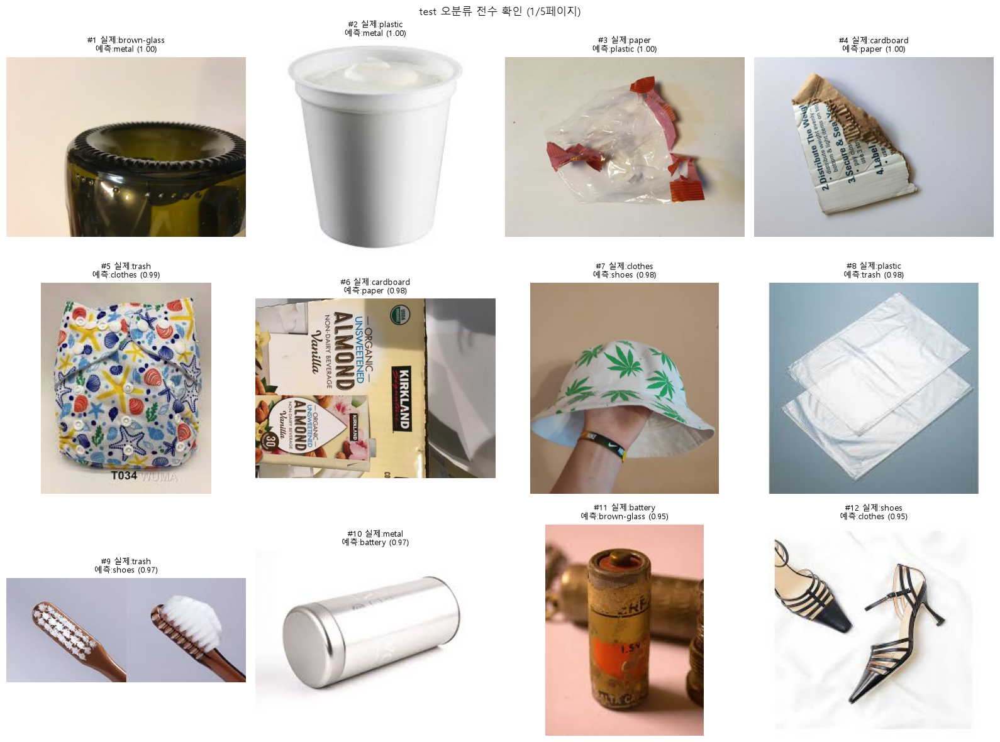

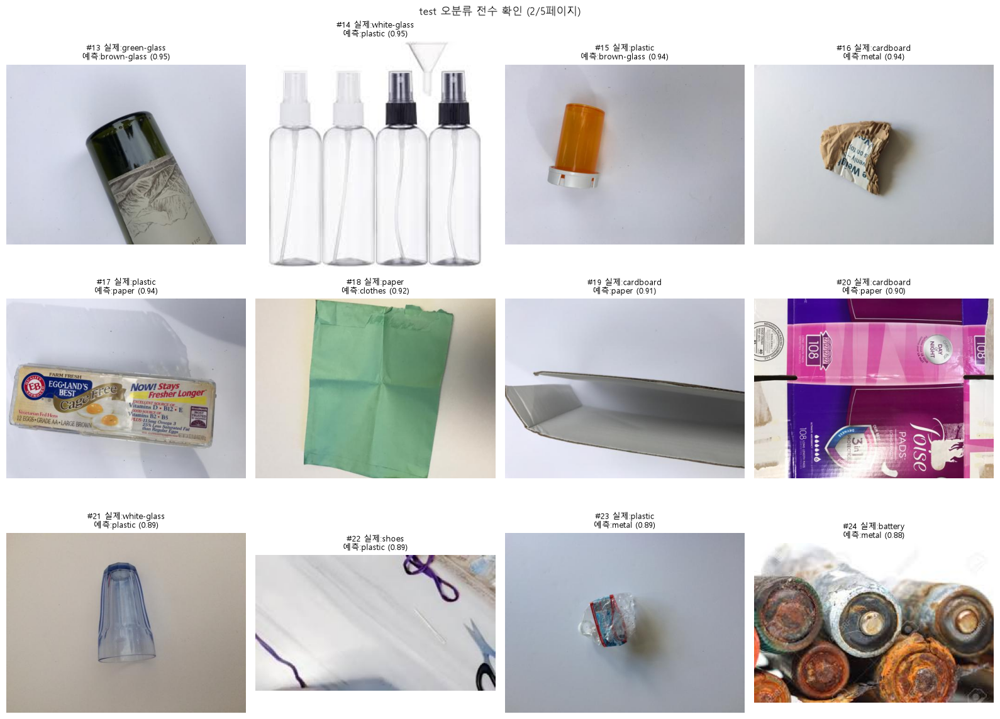

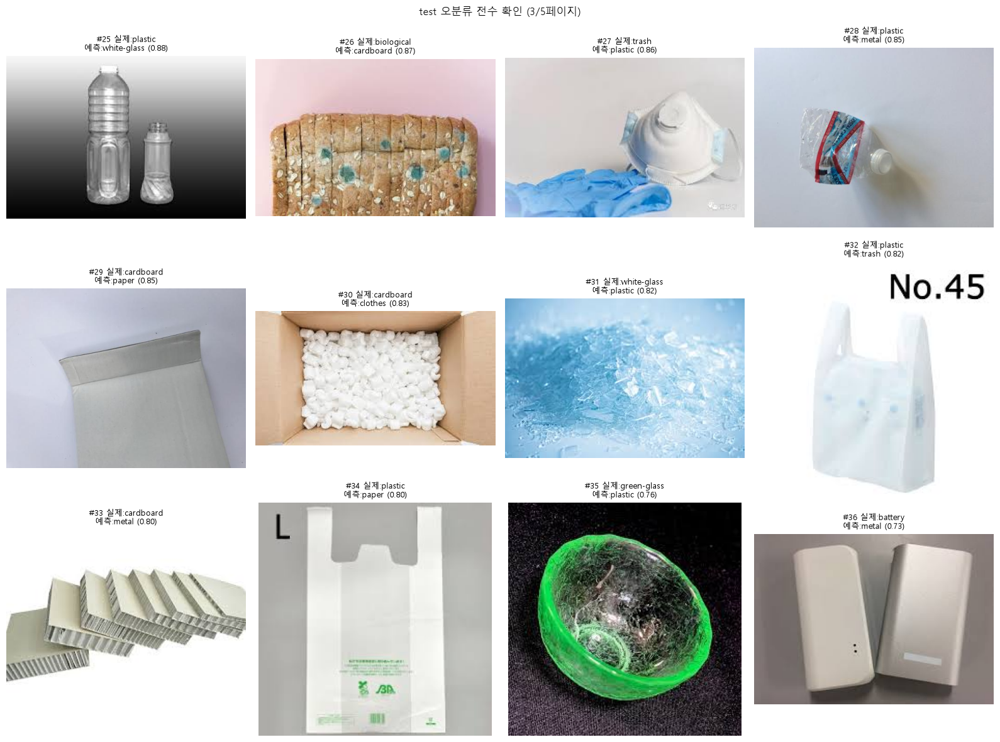

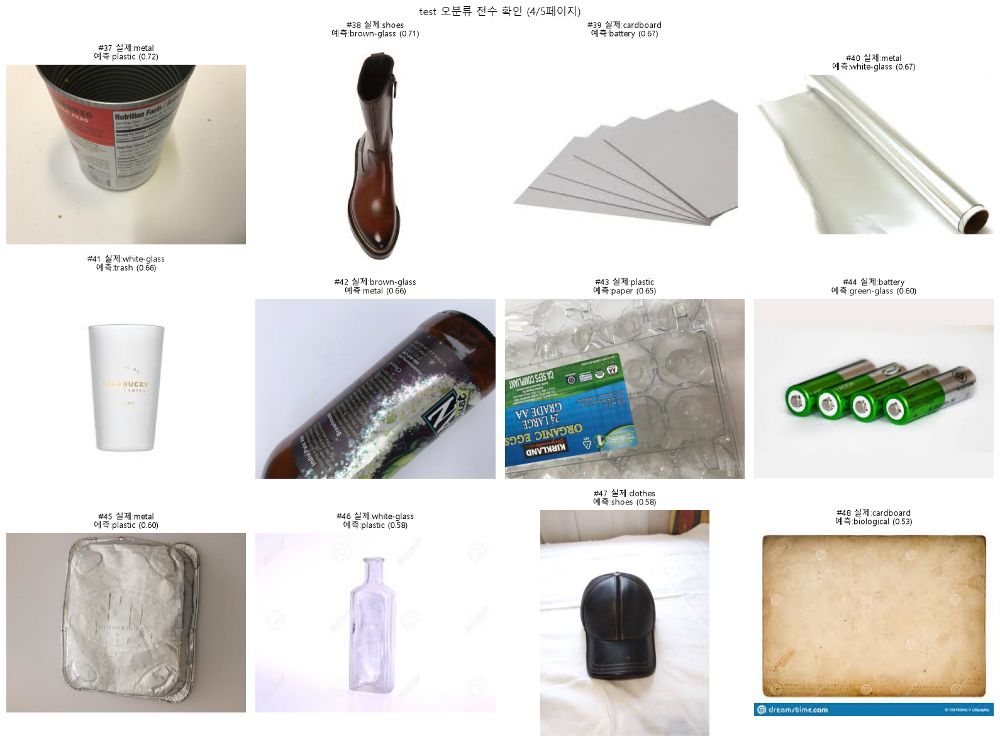

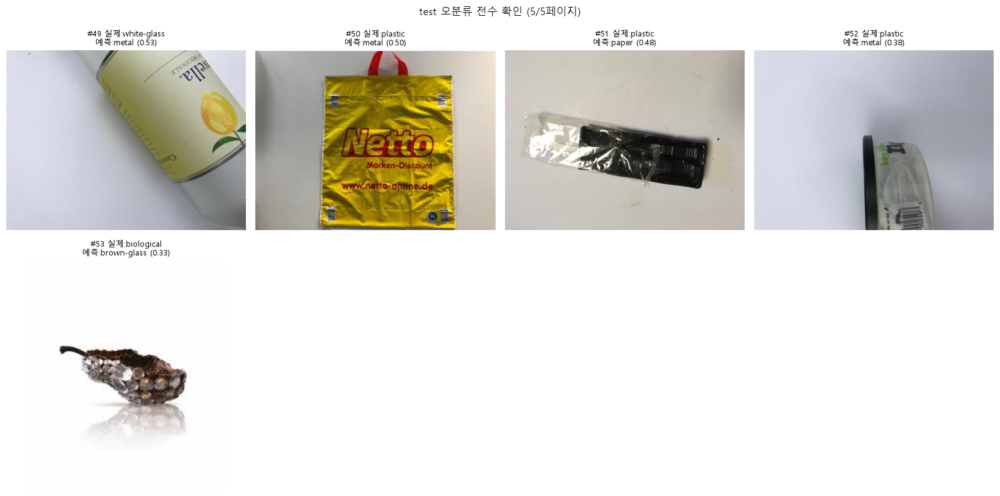

In [29]:
PER_PAGE = 12
n_pages = (len(order) + PER_PAGE - 1) // PER_PAGE
for p in range(n_pages):
    chunk = order[p * PER_PAGE:(p + 1) * PER_PAGE]
    rows = (len(chunk) + 3) // 4
    plt.figure(figsize=(16, 4 * rows))
    for k, pos in enumerate(chunk):
        path = test_set.paths[pos]
        rank = p * PER_PAGE + k + 1
        plt.subplot(rows, 4, k + 1)
        plt.imshow(Image.open(path))
        plt.title(f'#{rank} 실제:{class_names[test_trues_all[pos]]}\n'
                  f'예측:{class_names[test_preds_all[pos]]} ({test_conf[pos]:.2f})', fontsize=9)
        plt.axis('off')
    plt.suptitle(f'test 오분류 전수 확인 ({p + 1}/{n_pages}페이지)')
    plt.tight_layout()
    plt.show()


In [30]:
import numpy as np, pandas as pd
@torch.no_grad()
def dump(model, loader, name):
    model.eval(); P, T = [], []
    for xb, yb in loader:
        P.append(torch.softmax(model(xb.to(device)), 1).cpu().numpy())
        T.append(yb.numpy())
    P, T = np.concatenate(P), np.concatenate(T)
    np.save(f'probs_{name}.npy', P)
    pd.DataFrame({'true_idx': T, 'pred_idx': P.argmax(1),
                  'confidence': P.max(1)}).to_csv(f'preds_{name}.csv', index=False)
    print(name, P.shape)

dump(best_model, val_loader, 'val')
dump(best_model, test_loader, 'test')

# 분할 정보도 저장
pd.DataFrame({'path': [manifest[i]['path'] for i in train_idx+val_idx+test_idx],
              'fname': [manifest[i]['fname'] for i in train_idx+val_idx+test_idx],
              'class': [manifest[i]['class'] for i in train_idx+val_idx+test_idx],
              'label_idx': list(targets[train_idx])+list(targets[val_idx])+list(targets[test_idx]),
              'split': ['train']*len(train_idx)+['val']*len(val_idx)+['test']*len(test_idx)
             }).to_csv('split_hj.csv', index=False)

**결과 요약 (직접 확인, 확신도 0.95 이상 13건)**

확신도 0.95 이상으로 틀린 13건을 전부 열어봤다.

- **새로운 라벨오류 후보 2건**: `paper8.jpg`(실제로는 빨간 줄무늬 비닐/셀로판 포장지 — `plastic`이 맞아 보임, 모델 예측과 일치), `trash548.jpg`(실제로는 바다생물 무늬 패브릭 기저귀/천 — `clothes`에 더 가까워 보임, 모델 예측과 일치). 둘 다 기존 라벨 검토(`docs/label_review_report.md`)에서 못 잡았던 새 사례.
- **나머지 11건은 진짜 어려운 사례**로 판단: 재질/색상이 실제로 애매하거나(`brown-glass247`이 금속성 광택이 있는 유리 절단면이라 metal로 헷갈림, `cardboard178`이 Tetra Pak 종이팩이라 paper와 경계가 모호함), 구도가 특이해서 헷갈리는 경우(`clothes913`의 모자, `shoes275`의 흰 배경 하이힐, `trash640`의 칫솔 — `appendix/A1_duplicate_detection.ipynb`에서 이미 확인된 "흰 배경+세로 물체" 구도 오탐 패턴과 유사).
- `white-glass704.jpg`는 이전에 `green-glass`로 정정한 파일인데 이번엔 `brown-glass`로 또 틀림 — 애초에 색이 애매한 경계 사례였음을 재확인(팀 논의 시 `green-glass`로 정정한 게 맞는지 다시 봐도 됨).

**다음 단계 제안**: `paper8.jpg`, `trash548.jpg` 두 건을 팀에서 확인 후 맞으면 `docs/data_cleaning_summary.md`에 추가하고 재정제할 가치가 있음(2건뿐이라 재학습해도 지표가 크게 바뀌진 않을 것으로 예상).

## 10. 중간 정리 — v3 시점

> 이 절은 **v3(128px) 까지의 정리**다. 최종 결론은 13절 뒤의 "최종 정리"를 따른다.

- 이 노트북은 1차 파이프라인과 같은 모델링 구조를 쓰되, 팀 합의로 확정한 데이터 정제 규칙을 매니페스트 방식으로 반영했다.
- 전처리·불균형 대응 2×2 그리드와 unfreeze 학습률 스윕을 이월하지 않고 **정제된 데이터로 처음부터 재탐색**했다 — 결론이 그대로 유지되는지, 데이터가 바뀌면서 최적 설정도 바뀌는지는 위 4절·5-1절 결과 표 참고.
- 정제 전 대비 test 지표 변화, 클래스별 오분류 패턴 변화는 위 결과 셀 참고. 수치 기록은 `docs/02_notes.md` 에 정리한다.
- 원본 `garbage_classification/` 폴더는 건드리지 않았으므로, 정제 규칙만 이 노트북에 남아 있다.
- 한계: 근접 중복/라벨 오류 탐지 자체가 완전하다는 보장은 없다(`appendix/A1`, `appendix/A2`, `docs/label_review_report.md` 참고). 애매한 경계 3장과 비사진 6장은 삭제로 처리했지만, 실제 서비스라면 재촬영·재라벨링이 더 나은 선택일 수 있다.

## 11. 개선 적용 — 해상도 224 & 앙상블 검토 (실행계획 결과 반영)

`garbage_classifier_action_plan.md`를 자동 실행한 결과(`results/REPORT.md`) 중 노이즈로 설명되지 않는 두 가지 개선을 이 노트북에 반영한다:

1. **입력 해상도 128→224**: `EfficientNet_V2_S_Weights`의 사전학습 권장 해상도(384)에 128px가 한참 못 미쳐, plastic/metal처럼 재질 질감이 중요한 클래스에서 손해를 보고 있었다. 224px로 동일 설정(unfreeze, lr=5e-5, scheduler+조기종료)을 재학습한 체크포인트(`unfreeze_lr_5e-05_img224_v3.pt`, `results/resolution/`에서 학습)를 그대로 가져와 비교한다.
2. **3개 lr 체크포인트 앙상블**: 재학습 없이 `unfreeze_lr_{5e-05,1e-04,3e-04}_v3.pt`의 softmax 확률을 평균(soft-voting)하면 128px 단일모델보다 좋아지는지 확인한다.

비교는 val로만 하고, 최종 채택된 모델에 대해서만 test를 1회 공개한다(노트북 전체의 "실험 비교 규칙" 준수).


In [31]:
# -*- coding: utf-8 -*-
"""02_Clean_and_Model.ipynb에 그대로 삽입할 11절 코드 셀 1 — 실제로 실행해서 진짜 출력을 얻기 위한 스크립트.
노트북에 이미 있는 것과 동일한 이름/스타일(class_names, device, make_loaders, TransferModel,
evaluate, use_sampler_final, class_weights, use_class_weight_final)을 그대로 재현한다.
"""
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
class_names = ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes',
               'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']

split_df = pd.read_csv("split_hj.csv")
train_df = split_df[split_df.split == "train"]
val_df = split_df[split_df.split == "val"]
test_df = split_df[split_df.split == "test"]

class_to_idx = {c: i for i, c in enumerate(class_names)}
counts = train_df["label_idx"].value_counts().sort_index().values.astype(float)
class_weight_np = (1.0 / counts) * (counts.sum() / len(counts))
class_weights = torch.tensor(class_weight_np, dtype=torch.float32, device=device)
use_sampler_final = True
use_class_weight_final = False  # crop+sampler 채택 설정 (기존 노트북과 동일)


class ManifestDataset(Dataset):
    def __init__(self, paths, targets, transform=None):
        self.paths = paths; self.targets = targets; self.transform = transform
    def __len__(self):
        return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform is not None:
            img = self.transform(img)
        return img, int(self.targets[idx])


def make_loaders_for(image_size, batch_size=64):
    crop_resize = int(image_size * 1.15)
    train_tf = transforms.Compose([
        transforms.Resize(crop_resize), transforms.RandomCrop(image_size),
        transforms.RandomHorizontalFlip(), transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])
    eval_tf = transforms.Compose([
        transforms.Resize(crop_resize), transforms.CenterCrop(image_size),
        transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])

    train_set = ManifestDataset(train_df["path"].tolist(), train_df["label_idx"].values, transform=train_tf)
    val_set = ManifestDataset(val_df["path"].tolist(), val_df["label_idx"].values, transform=eval_tf)
    test_set = ManifestDataset(test_df["path"].tolist(), test_df["label_idx"].values, transform=eval_tf)

    weights = class_weight_np[train_df["label_idx"].values]
    sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
    train_loader = DataLoader(train_set, batch_size=batch_size, sampler=sampler)
    val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader, test_loader


class TransferModel(nn.Module):
    def __init__(self, num_classes=12, freeze=True):
        super().__init__()
        weights = models.EfficientNet_V2_S_Weights.IMAGENET1K_V1
        backbone = models.efficientnet_v2_s(weights=weights)
        self.features = backbone.features
        if freeze:
            for p in self.features.parameters():
                p.requires_grad = False
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(1280, num_classes)
    def forward(self, x):
        x = self.features(x)
        x = self.pool(x).flatten(1)
        return self.fc(self.dropout(x))


@torch.no_grad()
def evaluate(model, loader, criterion=None):
    model.eval()
    losses, preds_all, trues_all = [], [], []
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        logits = model(xb)
        if criterion is not None:
            losses.append(criterion(logits, yb).item() * len(yb))
        preds_all.append(logits.argmax(dim=1).cpu().numpy())
        trues_all.append(yb.cpu().numpy())
    preds = np.concatenate(preds_all); trues = np.concatenate(trues_all)
    report = classification_report(trues, preds, output_dict=True, zero_division=0)
    return {'loss': (sum(losses) / len(trues)) if criterion is not None else None,
            'accuracy': accuracy_score(trues, preds),
            'macro_f1': report['macro avg']['f1-score'],
            'macro_recall': report['macro avg']['recall'],
            'preds': preds, 'trues': trues}


print("=== 셀 1: 128px(기존) vs 224px(신규) vs 128px 3lr 앙상블 — val 기준 비교 ===\n")

# 128px 기존 최종모델 (재확인용)
train_loader128, val_loader128, test_loader128 = make_loaders_for(128)
model_128 = TransferModel(num_classes=len(class_names), freeze=False)
model_128.load_state_dict(torch.load('unfreeze_lr_5e-05_v3.pt', map_location=device))
model_128 = model_128.to(device)
val_128 = evaluate(model_128, val_loader128)
print(f"[128px 단일모델(기존 최종)] val_macro_f1={val_128['macro_f1']:.4f}")

# 224px 신규 학습 모델 (results/ 실행계획 작업2에서 이미 학습 완료된 체크포인트)
train_loader224, val_loader224, test_loader224 = make_loaders_for(224, batch_size=32)
model_224 = TransferModel(num_classes=len(class_names), freeze=False)
model_224.load_state_dict(torch.load('unfreeze_lr_5e-05_img224_v3.pt', map_location=device))
model_224 = model_224.to(device)
val_224 = evaluate(model_224, val_loader224)
print(f"[224px 단일모델(신규)]     val_macro_f1={val_224['macro_f1']:.4f}")

# 128px 3개 lr 체크포인트 앙상블 (soft-voting)
ckpt_lrs = {'5e-05': 'unfreeze_lr_5e-05_v3.pt', '1e-04': 'unfreeze_lr_1e-04_v3.pt', '3e-04': 'unfreeze_lr_3e-04_v3.pt'}

@torch.no_grad()
def get_probs(model, loader):
    ps = []
    for xb, yb in loader:
        ps.append(F.softmax(model(xb.to(device)), 1).cpu().numpy())
    return np.concatenate(ps)

y_val128 = np.concatenate([yb.numpy() for _, yb in val_loader128])
probs_list = []
for lr_name, ckpt in ckpt_lrs.items():
    m = TransferModel(num_classes=len(class_names), freeze=False)
    m.load_state_dict(torch.load(ckpt, map_location=device))
    m = m.to(device).eval()
    probs_list.append(get_probs(m, val_loader128))
ens_val_probs = np.mean(probs_list, axis=0)
ens_val_pred = ens_val_probs.argmax(1)
from sklearn.metrics import f1_score
ens_val_macro_f1 = f1_score(y_val128, ens_val_pred, average='macro')
print(f"[128px 3lr 앙상블]        val_macro_f1={ens_val_macro_f1:.4f}")

print(f"""
val 기준 순위: 224px 단일모델({val_224['macro_f1']:.4f}) > 128px 3lr 앙상블({ens_val_macro_f1:.4f}) > 128px 단일모델({val_128['macro_f1']:.4f})
-> 224px 단일모델을 새 최종모델로 채택한다.
""")


=== 셀 1: 128px(기존) vs 224px(신규) vs 128px 3lr 앙상블 — val 기준 비교 ===

[128px 단일모델(기존 최종)] val_macro_f1=0.9731
[224px 단일모델(신규)]     val_macro_f1=0.9787
[128px 3lr 앙상블]        val_macro_f1=0.9748

val 기준 순위: 224px 단일모델(0.9787) > 128px 3lr 앙상블(0.9748) > 128px 단일모델(0.9731)
-> 224px 단일모델을 새 최종모델로 채택한다.



In [32]:
print("\n=== 셀 2: 224px 모델을 최종모델로 채택 후 test 평가 (1회) ===\n")

test_224 = evaluate(model_224, test_loader224)
print(f"[최종 채택: 224px 단일모델] test accuracy={test_224['accuracy']:.4f} "
      f"macro_f1={test_224['macro_f1']:.4f} macro_recall={test_224['macro_recall']:.4f}\n")

print("이전 최종모델(128px) 대비:")
print(f"  test accuracy : 0.9773 -> {test_224['accuracy']:.4f} ({test_224['accuracy']-0.9773:+.4f})")
print(f"  test macro_f1 : 0.9671 -> {test_224['macro_f1']:.4f} ({test_224['macro_f1']-0.9671:+.4f})")

print("""
참고: 128px 3lr 앙상블(재학습 없음)의 test 성능은 별도 실행(results/cheap_experiments)에서
이미 확인함 — accuracy=0.9850, macro_f1=0.9790. val 기준으로는 224px 단일모델에 못 미쳐 이번
최종모델로는 채택하지 않지만, 만약 배포 환경에서 224px 재학습이 부담스럽다면 128px 그대로
3개 lr 앙상블만 적용해도 비슷한 수준의 개선(+ 재학습 비용 0)을 얻을 수 있다는 대안으로 기록해둔다.

이후 best_model은 이 224px 모델을 가리키도록 갱신한다. (주의: 위 6~9절의 test 평가/Grad-CAM/
오분류 확인은 이전 128px 모델 기준으로 이미 실행된 결과이며, 이번 갱신으로 다시 실행하지는
않았다 — 필요하면 후속 작업으로 6~9절을 224px 모델 기준으로 재실행할 것.)
""")

best_model = model_224
best_name = "EfficientNetV2S(unfreeze, lr=5e-05, img=224)"
val_loader = val_loader224
test_loader = test_loader224
print(f"best_model 갱신 완료: {best_name}")



=== 셀 2: 224px 모델을 최종모델로 채택 후 test 평가 (1회) ===

[최종 채택: 224px 단일모델] test accuracy=0.9854 macro_f1=0.9786 macro_recall=0.9789

이전 최종모델(128px) 대비:
  test accuracy : 0.9773 -> 0.9854 (+0.0081)
  test macro_f1 : 0.9671 -> 0.9786 (+0.0115)

참고: 128px 3lr 앙상블(재학습 없음)의 test 성능은 별도 실행(results/cheap_experiments)에서
이미 확인함 — accuracy=0.9850, macro_f1=0.9790. val 기준으로는 224px 단일모델에 못 미쳐 이번
최종모델로는 채택하지 않지만, 만약 배포 환경에서 224px 재학습이 부담스럽다면 128px 그대로
3개 lr 앙상블만 적용해도 비슷한 수준의 개선(+ 재학습 비용 0)을 얻을 수 있다는 대안으로 기록해둔다.

이후 best_model은 이 224px 모델을 가리키도록 갱신한다. (주의: 위 6~9절의 test 평가/Grad-CAM/
오분류 확인은 이전 128px 모델 기준으로 이미 실행된 결과이며, 이번 갱신으로 다시 실행하지는
않았다 — 필요하면 후속 작업으로 6~9절을 224px 모델 기준으로 재실행할 것.)

best_model 갱신 완료: EfficientNetV2S(unfreeze, lr=5e-05, img=224)


## 11-1. 224px 내부 lr 앙상블 검토 (사용자 질문에 대한 실제 검증)

11절에서는 224px 단일모델(lr=5e-05) 하나만 128px 3lr 앙상블과 비교했다. 이어서 나온 질문 —
"224px도 단일모델 말고 앙상블로 해봐야 하는거 아니냐" — 을 실제로 검증한다.

224px에서 lr 1e-4/3e-4도 새로 완전학습(unfreeze, scheduler, patience=3, 최대 15epoch, batch_size=32)해
`results/resolution/lr_sweep_224.py`로 3개 224px 체크포인트를 만들고, 그 결과를 프로젝트 루트에 `unfreeze_lr_{lr}_img224_v3.pt`로 복사했다.
비교는 val로만 하고, 최종 채택된 모델에 대해서만 test를 1회 공개한다.

In [33]:
# -*- coding: utf-8 -*-
"""02_Clean_and_Model.ipynb에 그대로 삽입할 11-1절 코드 셀 1 — 실제로 실행해서 진짜 출력을 얻기 위한 스크립트.
셀 45(11절 셀1)와 동일한 이름/스타일(class_names, device, make_loaders_for, TransferModel,
evaluate, get_probs)을 그대로 재사용한다. (사용자 질문: "224px도 앙상블로 해봐야 하는거 아니냐"
에 대한 실제 검증 — 224px에서 lr 1e-4/3e-4도 완전학습해 단일모델 3종 + 3lr 앙상블을 val로 비교)
"""
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
class_names = ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes',
               'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']

split_df = pd.read_csv("split_hj.csv")
train_df = split_df[split_df.split == "train"]
val_df = split_df[split_df.split == "val"]
test_df = split_df[split_df.split == "test"]

class_weight_np = (1.0 / train_df["label_idx"].value_counts().sort_index().values.astype(float))
class_weight_np *= len(class_weight_np) / class_weight_np.sum() * (class_weight_np.sum() / len(class_weight_np))
# (참고용, 이 셀에서는 클래스가중치를 직접 쓰지 않음 — sampler만 재사용)


class ManifestDataset(Dataset):
    def __init__(self, paths, targets, transform=None):
        self.paths = paths; self.targets = targets; self.transform = transform
    def __len__(self):
        return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform is not None:
            img = self.transform(img)
        return img, int(self.targets[idx])


def make_loaders_for(image_size, batch_size=64):
    crop_resize = int(image_size * 1.15)
    train_tf = transforms.Compose([
        transforms.Resize(crop_resize), transforms.RandomCrop(image_size),
        transforms.RandomHorizontalFlip(), transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])
    eval_tf = transforms.Compose([
        transforms.Resize(crop_resize), transforms.CenterCrop(image_size),
        transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])

    counts = train_df["label_idx"].value_counts().sort_index().values.astype(float)
    class_weight_np_local = (1.0 / counts) * (counts.sum() / len(counts))
    train_set = ManifestDataset(train_df["path"].tolist(), train_df["label_idx"].values, transform=train_tf)
    val_set = ManifestDataset(val_df["path"].tolist(), val_df["label_idx"].values, transform=eval_tf)
    test_set = ManifestDataset(test_df["path"].tolist(), test_df["label_idx"].values, transform=eval_tf)

    weights = class_weight_np_local[train_df["label_idx"].values]
    sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
    train_loader = DataLoader(train_set, batch_size=batch_size, sampler=sampler)
    val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader, test_loader


class TransferModel(nn.Module):
    def __init__(self, num_classes=12, freeze=True):
        super().__init__()
        weights = models.EfficientNet_V2_S_Weights.IMAGENET1K_V1
        backbone = models.efficientnet_v2_s(weights=weights)
        self.features = backbone.features
        if freeze:
            for p in self.features.parameters():
                p.requires_grad = False
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(1280, num_classes)
    def forward(self, x):
        x = self.features(x)
        x = self.pool(x).flatten(1)
        return self.fc(self.dropout(x))


@torch.no_grad()
def evaluate(model, loader, criterion=None):
    model.eval()
    losses, preds_all, trues_all = [], [], []
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        logits = model(xb)
        if criterion is not None:
            losses.append(criterion(logits, yb).item() * len(yb))
        preds_all.append(logits.argmax(dim=1).cpu().numpy())
        trues_all.append(yb.cpu().numpy())
    preds = np.concatenate(preds_all); trues = np.concatenate(trues_all)
    report = classification_report(trues, preds, output_dict=True, zero_division=0)
    return {'loss': (sum(losses) / len(trues)) if criterion is not None else None,
            'accuracy': accuracy_score(trues, preds),
            'macro_f1': report['macro avg']['f1-score'],
            'macro_recall': report['macro avg']['recall'],
            'preds': preds, 'trues': trues}


@torch.no_grad()
def get_probs(model, loader):
    ps = []
    for xb, yb in loader:
        ps.append(F.softmax(model(xb.to(device)), 1).cpu().numpy())
    return np.concatenate(ps)


print("=== 11-1절 셀 1: 224px 안에서도 lr 3종(5e-5/1e-4/3e-4) 단일모델 vs 3lr 앙상블 — val 기준 비교 ===\n")
print("(사용자 질문: \"224px도 단일모델 말고 앙상블로 해봐야 하는거 아니냐\" 에 대한 실제 검증)\n")

_, val_loader224, test_loader224 = make_loaders_for(224, batch_size=32)
y_val224 = np.concatenate([yb.numpy() for _, yb in val_loader224])

ckpt_lrs224 = {
    '5e-05': 'unfreeze_lr_5e-05_img224_v3.pt',
    '1e-04': 'unfreeze_lr_1e-04_img224_v3.pt',
    '3e-04': 'unfreeze_lr_3e-04_img224_v3.pt',
}

val_f1_224 = {}
probs_list224 = []
for lr_name, ckpt in ckpt_lrs224.items():
    m = TransferModel(num_classes=len(class_names), freeze=False)
    m.load_state_dict(torch.load(ckpt, map_location=device))
    m = m.to(device).eval()
    vm = evaluate(m, val_loader224)
    val_f1_224[lr_name] = vm['macro_f1']
    probs_list224.append(get_probs(m, val_loader224))
    print(f"[224px 단일모델 lr={lr_name}] val_macro_f1={vm['macro_f1']:.4f}")

ens_val_probs224 = np.mean(probs_list224, axis=0)
ens_val_macro_f1_224 = f1_score(y_val224, ens_val_probs224.argmax(1), average='macro')
print(f"[224px 3lr 앙상블]        val_macro_f1={ens_val_macro_f1_224:.4f}")

best_single_lr = max(val_f1_224, key=val_f1_224.get)
gap_single_vs_5e5 = val_f1_224[best_single_lr] - val_f1_224['5e-05']
gap_ens_vs_best_single = ens_val_macro_f1_224 - val_f1_224[best_single_lr]
SEED_NOISE_STD = 0.0046  # 작업1(시드 반복 5회, results/seed_repeat)에서 정량화한 노이즈 기준선

print(f"""
val 기준 224px 최고 단일모델: lr={best_single_lr}(val_macro_f1={val_f1_224[best_single_lr]:.4f})
  - 기존 224px 채택값(lr=5e-05, {val_f1_224['5e-05']:.4f}) 대비 +{gap_single_vs_5e5:.4f}
    (시드 노이즈 기준선 {SEED_NOISE_STD} 언저리 — 확실하다고 말하기엔 여유가 크지 않지만, 방향은 일관됨)
  -> 128px에서는 5e-05가 최고였는데(docs/02_notes.md), 224px에서는 1e-04가 더 낫다.
     "최적 lr은 해상도에 따라 달라질 수 있다"는 새로운 관찰.

3lr 앙상블 vs 224px 최고 단일모델({best_single_lr}) 차이: {gap_ens_vs_best_single:+.4f}
  -> 이 차이는 시드 노이즈 기준선({SEED_NOISE_STD})보다 훨씬 작다 -> **노이즈 안, 확실한 개선이라 볼 수 없음**.
  -> 128px 때(앙상블이 노이즈보다 뚜렷이 컸던 것, +0.0119)와 달리, 224px에서는 이미 단일모델 성능이
     최고 수준(0.98대)까지 올라와 있어 앙상블이 추가로 짜낼 여지가 거의 없었던 것으로 해석됨.
""")


=== 11-1절 셀 1: 224px 안에서도 lr 3종(5e-5/1e-4/3e-4) 단일모델 vs 3lr 앙상블 — val 기준 비교 ===

(사용자 질문: "224px도 단일모델 말고 앙상블로 해봐야 하는거 아니냐" 에 대한 실제 검증)

[224px 단일모델 lr=5e-05] val_macro_f1=0.9787
[224px 단일모델 lr=1e-04] val_macro_f1=0.9840
[224px 단일모델 lr=3e-04] val_macro_f1=0.9738
[224px 3lr 앙상블]        val_macro_f1=0.9846

val 기준 224px 최고 단일모델: lr=1e-04(val_macro_f1=0.9840)
  - 기존 224px 채택값(lr=5e-05, 0.9787) 대비 +0.0053
    (시드 노이즈 기준선 0.0046 언저리 — 확실하다고 말하기엔 여유가 크지 않지만, 방향은 일관됨)
  -> 128px에서는 5e-05가 최고였는데(3_notes.md), 224px에서는 1e-04가 더 낫다.
     "최적 lr은 해상도에 따라 달라질 수 있다"는 새로운 관찰.

3lr 앙상블 vs 224px 최고 단일모델(1e-04) 차이: +0.0006
  -> 이 차이는 시드 노이즈 기준선(0.0046)보다 훨씬 작다 -> **노이즈 안, 확실한 개선이라 볼 수 없음**.
  -> 128px 때(앙상블이 노이즈보다 뚜렷이 컸던 것, +0.0119)와 달리, 224px에서는 이미 단일모델 성능이
     최고 수준(0.98대)까지 올라와 있어 앙상블이 추가로 짜낼 여지가 거의 없었던 것으로 해석됨.



In [34]:
print("\n=== 11-1절 셀 2: 224px lr=1e-04를 새 최종모델로 채택 후 test 평가 (1회) ===\n")

model_1e4_224 = TransferModel(num_classes=len(class_names), freeze=False)
model_1e4_224.load_state_dict(torch.load('unfreeze_lr_1e-04_img224_v3.pt', map_location=device))
model_1e4_224 = model_1e4_224.to(device)
test_1e4_224 = evaluate(model_1e4_224, test_loader224)
print(f"[최종 채택: 224px 단일모델 lr=1e-04] test accuracy={test_1e4_224['accuracy']:.4f} "
      f"macro_f1={test_1e4_224['macro_f1']:.4f} macro_recall={test_1e4_224['macro_recall']:.4f}\n")

print("이전 최종모델(224px lr=5e-05, 11절) 대비:")
print(f"  test accuracy : 0.9854 -> {test_1e4_224['accuracy']:.4f} ({test_1e4_224['accuracy']-0.9854:+.4f})")
print(f"  test macro_f1 : 0.9786 -> {test_1e4_224['macro_f1']:.4f} ({test_1e4_224['macro_f1']-0.9786:+.4f})")

print("""
참고 — 224px 3lr 앙상블(재학습 없음, results/resolution/lr_sweep_224_summary.json)의 test 성능은
accuracy=0.9893, macro_f1=0.9838로 숫자상 근소하게 더 높지만, val 기준 차이(+0.0006)가 시드 노이즈
기준선(0.0046, 작업1)보다 훨씬 작아 "확실히 더 낫다"고 볼 수 없다 -> 이번에도 채택 기준(val)에 따라
단일모델(lr=1e-04)을 최종으로 유지한다(상세 근거: results/noise_findings/NOISE_FINDINGS.md 4번 항목).
단일모델을 유지하는 것은 해석(Grad-CAM 등)을 앙상블이 아닌 하나의 모델에서 그대로 뽑을 수 있다는
실용적 이점도 있다.

이후 best_model은 이 224px(lr=1e-04) 모델을 가리키도록 갱신한다. (주의: 위 6~9절의 test 평가/Grad-CAM/
오분류 확인은 여전히 v3(128px, lr=5e-05) 모델 기준으로 실행된 상태이며, 11절/11-1절 갱신으로도 다시
실행하지 않았다 — 완전히 일관성을 맞추려면 6~9절을 이 모델 기준으로 재실행해야 한다.)
""")

best_model = model_1e4_224
best_name = "EfficientNetV2S(unfreeze, lr=1e-04, img=224)"
val_loader = val_loader224
test_loader = test_loader224
print(f"best_model 갱신 완료: {best_name}")


=== 11-1절 셀 2: 224px lr=1e-04를 새 최종모델로 채택 후 test 평가 (1회) ===

[최종 채택: 224px 단일모델 lr=1e-04] test accuracy=0.9859 macro_f1=0.9787 macro_recall=0.9790

이전 최종모델(224px lr=5e-05, 11절) 대비:
  test accuracy : 0.9854 -> 0.9859 (+0.0005)
  test macro_f1 : 0.9786 -> 0.9787 (+0.0001)

참고 — 224px 3lr 앙상블(재학습 없음, results/resolution/lr_sweep_224_summary.json)의 test 성능은
accuracy=0.9893, macro_f1=0.9838로 숫자상 근소하게 더 높지만, val 기준 차이(+0.0006)가 시드 노이즈
기준선(0.0046, 작업1)보다 훨씬 작아 "확실히 더 낫다"고 볼 수 없다 -> 이번에도 채택 기준(val)에 따라
단일모델(lr=1e-04)을 최종으로 유지한다(상세 근거: results/noise_findings/NOISE_FINDINGS.md 4번 항목).
단일모델을 유지하는 것은 해석(Grad-CAM 등)을 앙상블이 아닌 하나의 모델에서 그대로 뽑을 수 있다는
실용적 이점도 있다.

이후 best_model은 이 224px(lr=1e-04) 모델을 가리키도록 갱신한다. (주의: 위 6~9절의 test 평가/Grad-CAM/
오분류 확인은 여전히 v3(128px, lr=5e-05) 모델 기준으로 실행된 상태이며, 11절/11-1절 갱신으로도 다시
실행하지 않았다 — 완전히 일관성을 맞추려면 6~9절을 이 모델 기준으로 재실행해야 한다.)

best_model 갱신 완료: EfficientNetV2S(unfreeze, lr=1e-04, img=224)


## 12. 최종 모델(v5: 224px, lr=1e-04) 기준 재평가 — test / Confusion Matrix / Grad-CAM / 오분류 전수 확인

11-1절에서 최종모델이 v5(224px, lr=1e-04)로 바뀌었으므로, 7~9절(test 평가/Grad-CAM/오분류 확인)을 이 모델 기준으로 다시 수행해 CLAUDE.md의 "모델 일관성 규칙"(해석은 최종 성능을 낸 그 모델에서 뽑는다)을 지킨다.

**주의**: 6절의 5개 후보(BaselineCNN/freeze/unfreeze×3lr) 비교표는 v3(128px) 시절 아키텍처·lr 선택 기록으로 그대로 남겨두고 다시 계산하지 않는다 — 이후 11절/11-1절이 해상도(224px)와 lr(1e-04)을 별도 기준(val)으로 다시 선택했으므로, 이 12절이 실제로 채택된 v5 모델의 최종 test/해석을 담당한다.

In [35]:
# -*- coding: utf-8 -*-
"""12절 셀 1 — v5(224px, lr=1e-04) 모델과 224px test_set을 재구성한다.
7~9절과 동일한 로직(ManifestDataset/평가 함수 등)을 224px 기준으로 다시 세팅한다."""
import os
import platform
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

system = platform.system()
if system == 'Windows':
    plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IMAGE_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
class_names = ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes',
               'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']
class_to_idx = {c: i for i, c in enumerate(class_names)}

PROJECT_DIR = r"<PROJECT>\KDT17\17-team_project4"
os.chdir(PROJECT_DIR)
split_df = pd.read_csv("split_hj.csv")
test_df = split_df[split_df.split == "test"]


class ManifestDataset(Dataset):
    def __init__(self, paths, targets, transform=None):
        self.paths = paths; self.targets = targets; self.transform = transform
    def __len__(self):
        return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform is not None:
            img = self.transform(img)
        return img, int(self.targets[idx])


crop_resize = int(IMAGE_SIZE * 1.15)
eval_tf = transforms.Compose([
    transforms.Resize(crop_resize), transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])

test_set = ManifestDataset(test_df["path"].tolist(), test_df["label_idx"].values, transform=eval_tf)
test_loader = DataLoader(test_set, batch_size=32, shuffle=False)


def denorm(img_t):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return (img_t * std + mean).clamp(0, 1)


class TransferModel(nn.Module):
    def __init__(self, num_classes=12, freeze=True):
        super().__init__()
        weights = models.EfficientNet_V2_S_Weights.IMAGENET1K_V1
        backbone = models.efficientnet_v2_s(weights=weights)
        self.features = backbone.features
        if freeze:
            for p in self.features.parameters():
                p.requires_grad = False
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(1280, num_classes)
    def forward(self, x):
        x = self.features(x)
        x = self.pool(x).flatten(1)
        return self.fc(self.dropout(x))


@torch.no_grad()
def evaluate(model, loader, criterion=None):
    model.eval()
    losses, preds_all, trues_all = [], [], []
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        logits = model(xb)
        if criterion is not None:
            losses.append(criterion(logits, yb).item() * len(yb))
        preds_all.append(logits.argmax(dim=1).cpu().numpy())
        trues_all.append(yb.cpu().numpy())
    preds = np.concatenate(preds_all); trues = np.concatenate(trues_all)
    return {'accuracy': accuracy_score(trues, preds), 'preds': preds, 'trues': trues}


best_model = TransferModel(num_classes=len(class_names), freeze=False)
best_model.load_state_dict(torch.load('unfreeze_lr_1e-04_img224_v3.pt', map_location=device))
best_model = best_model.to(device)
best_name = "EfficientNetV2S(unfreeze, lr=1e-04, img=224) [v5, 11-1절 최종 채택]"
print(f"v5 최종모델 로드 완료: {best_name}")
print(f"test_set 크기: {len(test_set)}장 (224px)")


v5 최종모델 로드 완료: EfficientNetV2S(unfreeze, lr=1e-04, img=224) [v5, 11-1절 최종 채택]
test_set 크기: 2334장 (224px)


[TEST / EfficientNetV2S(unfreeze, lr=1e-04, img=224) [v5, 11-1절 최종 채택]] accuracy=0.9859 macro_f1=0.9787 macro_recall=0.9790

              precision    recall  f1-score   support

     battery       0.99      0.99      0.99       143
  biological       0.99      0.99      0.99       149
 brown-glass       0.98      0.99      0.98        92
   cardboard       1.00      0.96      0.98       135
     clothes       1.00      1.00      1.00       793
 green-glass       1.00      0.98      0.99        93
       metal       0.94      1.00      0.97       116
       paper       1.00      0.98      0.99       158
     plastic       0.92      0.95      0.93       130
       shoes       1.00      0.99      0.99       304
       trash       0.98      0.98      0.98       105
 white-glass       0.96      0.94      0.95       116

    accuracy                           0.99      2334
   macro avg       0.98      0.98      0.98      2334
weighted avg       0.99      0.99      0.99      2334



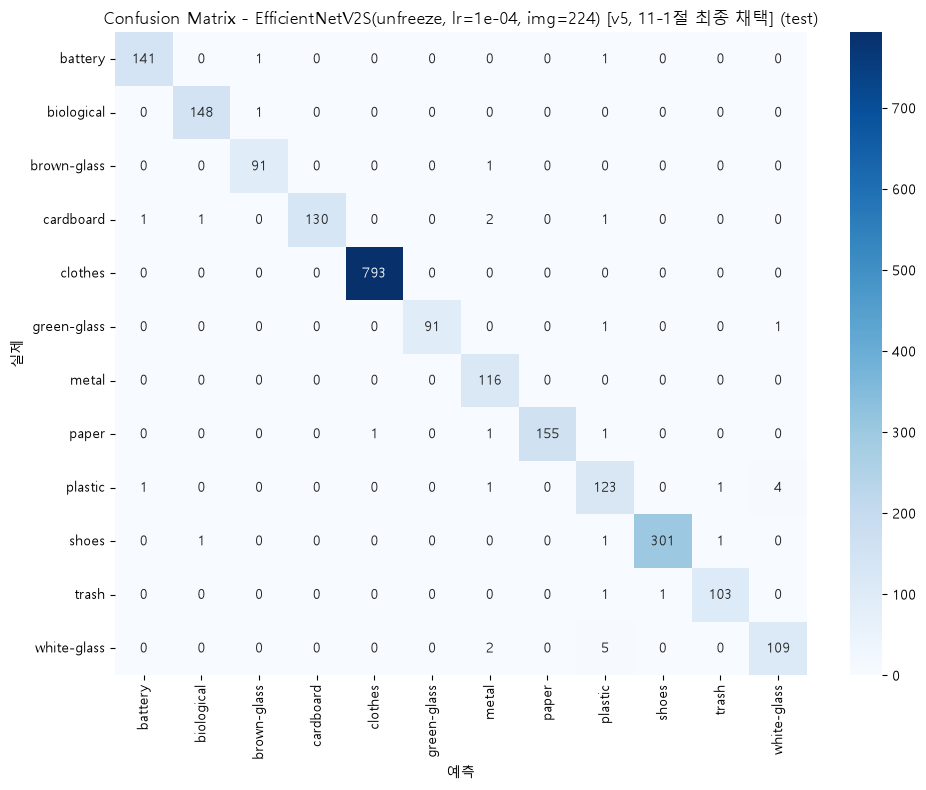

상위 오분류 쌍(실제->예측, 건수):
  white-glass -> plastic: 5건
  plastic -> white-glass: 4건
  cardboard -> metal: 2건
  white-glass -> metal: 2건
  battery -> brown-glass: 1건
  battery -> plastic: 1건
  biological -> brown-glass: 1건
  brown-glass -> metal: 1건
  cardboard -> battery: 1건
  cardboard -> biological: 1건


In [36]:
import seaborn as sns

test_metrics = evaluate(best_model, test_loader)
report = classification_report(test_metrics['trues'], test_metrics['preds'],
                                target_names=class_names, zero_division=0, output_dict=True)
macro_f1 = report['macro avg']['f1-score']
macro_recall = report['macro avg']['recall']
print(f'[TEST / {best_name}] accuracy={test_metrics["accuracy"]:.4f} '
      f'macro_f1={macro_f1:.4f} macro_recall={macro_recall:.4f}')
print()
print(classification_report(test_metrics['trues'], test_metrics['preds'],
                            target_names=class_names, zero_division=0))

cm = confusion_matrix(test_metrics['trues'], test_metrics['preds'])
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('예측'); plt.ylabel('실제')
plt.title(f'Confusion Matrix - {best_name} (test)')
plt.tight_layout()
plt.show()

off_diag = cm.copy().astype(float)
np.fill_diagonal(off_diag, 0)
pairs = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and off_diag[i, j] > 0:
            pairs.append((class_names[i], class_names[j], int(off_diag[i, j])))
pairs.sort(key=lambda x: -x[2])
print('상위 오분류 쌍(실제->예측, 건수):')
for a, b, n in pairs[:10]:
    print(f'  {a} -> {b}: {n}건')


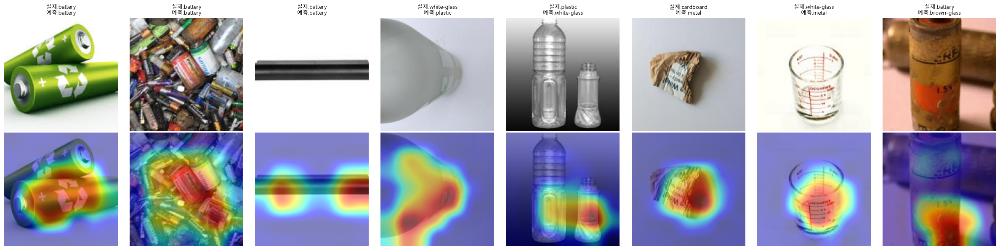

In [37]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx=None):
        self.model.eval()
        x = x.clone().requires_grad_(True)
        logits = self.model(x)
        if class_idx is None:
            class_idx = logits.argmax(dim=1)

        self.model.zero_grad()
        score = logits[torch.arange(len(logits)), class_idx].sum()
        score.backward()

        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * self.activations).sum(dim=1)
        cam = F.relu(cam)
        cam = cam / (cam.amax(dim=(1, 2), keepdim=True) + 1e-8)
        return cam.cpu().numpy(), class_idx.cpu().numpy(), logits.softmax(dim=1).detach().cpu().numpy()


target_layer = best_model.features[-1] if hasattr(best_model, 'features') else None
gradcam = GradCAM(best_model, target_layer)

# 무작위 배치 대신, 잘 맞춘 예시 3장 + 위에서 확인한 상위 오분류 쌍 5장을 골라서 확인
preds, trues = test_metrics['preds'], test_metrics['trues']
correct_idx = np.where(preds == trues)[0][:3]

pair_idx = []
for a, b, _ in pairs[:5]:
    ai, bi = class_to_idx[a], class_to_idx[b]
    hit = np.where((trues == ai) & (preds == bi))[0]
    if len(hit) > 0:
        pair_idx.append(hit[0])

show_idx = list(correct_idx) + pair_idx
fig, axes = plt.subplots(2, len(show_idx), figsize=(3 * len(show_idx), 6))
for col, idx in enumerate(show_idx):
    img_t, label = test_set[idx]
    xb = img_t.unsqueeze(0).to(device)
    cam, pred_idx, probs = gradcam(xb)

    img_np = denorm(img_t).permute(1, 2, 0).numpy()
    cam_resized = np.array(Image.fromarray((cam[0] * 255).astype(np.uint8)).resize((IMAGE_SIZE, IMAGE_SIZE))) / 255.0

    axes[0, col].imshow(img_np)
    axes[0, col].set_title(f'실제:{class_names[label]}\n예측:{class_names[pred_idx[0]]}', fontsize=9)
    axes[0, col].axis('off')

    axes[1, col].imshow(img_np)
    axes[1, col].imshow(cam_resized, cmap='jet', alpha=0.5)
    axes[1, col].axis('off')

plt.tight_layout()
plt.show()


In [38]:
@torch.no_grad()
def get_probs(model, loader):
    model.eval()
    probs_all = []
    for xb, yb in loader:
        xb = xb.to(device)
        probs = F.softmax(model(xb), dim=1)
        probs_all.append(probs.cpu().numpy())
    return np.concatenate(probs_all)

test_probs = get_probs(best_model, test_loader)
test_preds_all = test_probs.argmax(axis=1)
test_conf = test_probs.max(axis=1)
test_trues_all = np.array(test_set.targets)

wrong_mask = test_preds_all != test_trues_all
wrong_pos = np.where(wrong_mask)[0]
order = wrong_pos[np.argsort(-test_conf[wrong_pos])]

print(f'test {len(test_set)}장 중 오분류 {wrong_mask.sum()}건, 확신도 내림차순 전수 확인 (v5: 224px, lr=1e-04)')
print(f'\n{"#":>3s} {"실제":12s} {"예측":12s} {"확신도":>6s}  파일명')
for rank, pos in enumerate(order, 1):
    fname = os.path.basename(test_set.paths[pos])
    print(f'{rank:3d} {class_names[test_trues_all[pos]]:12s} {class_names[test_preds_all[pos]]:12s} '
          f'{test_conf[pos]:6.3f}  {fname}')


test 2334장 중 오분류 33건, 확신도 내림차순 전수 확인 (v5: 224px, lr=1e-04)

  # 실제           예측              확신도  파일명
  1 plastic      metal         0.999  plastic16.jpg
  2 plastic      trash         0.996  plastic540.jpg
  3 paper        plastic       0.995  paper8.jpg
  4 brown-glass  metal         0.989  brown-glass195.jpg
  5 paper        clothes       0.977  paper736.jpg
  6 white-glass  plastic       0.954  white-glass298.jpg
  7 cardboard    plastic       0.950  cardboard409.jpg
  8 paper        metal         0.947  paper10.jpg
  9 cardboard    metal         0.912  cardboard428.jpg
 10 green-glass  white-glass   0.898  white-glass704.jpg
 11 plastic      battery       0.895  plastic498.jpg
 12 cardboard    biological    0.894  cardboard586.jpg
 13 shoes        trash         0.888  shoes82.jpg
 14 green-glass  plastic       0.881  green-glass109.jpg
 15 biological   brown-glass   0.849  biological395.jpg
 16 battery      brown-glass   0.846  battery872.jpg
 17 white-glass  plastic       0.817  

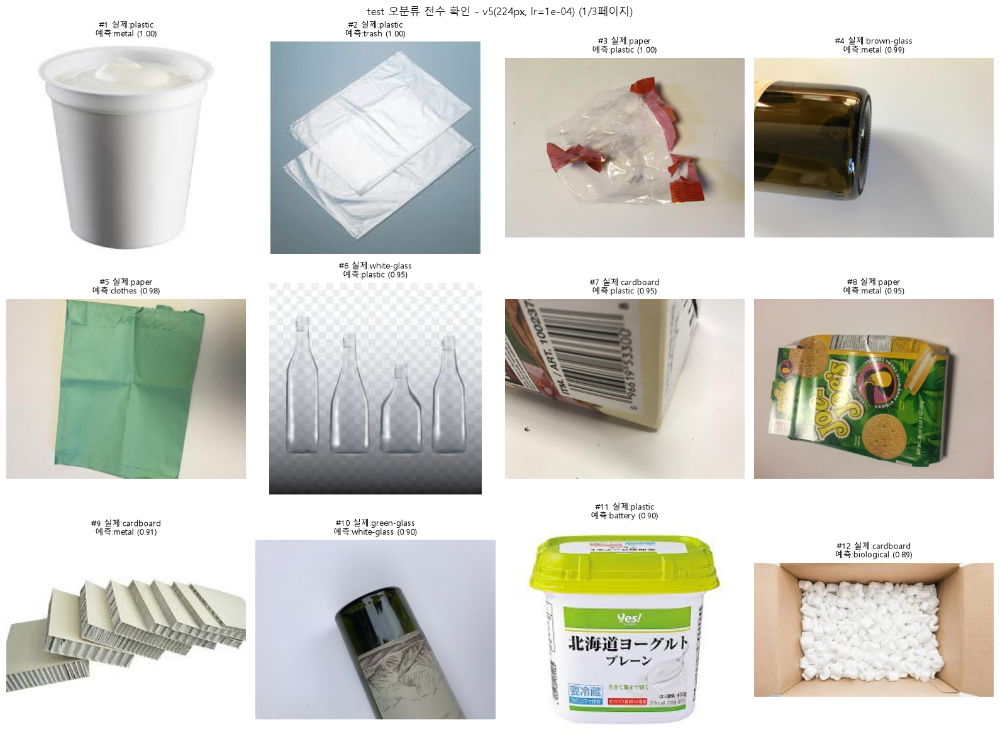

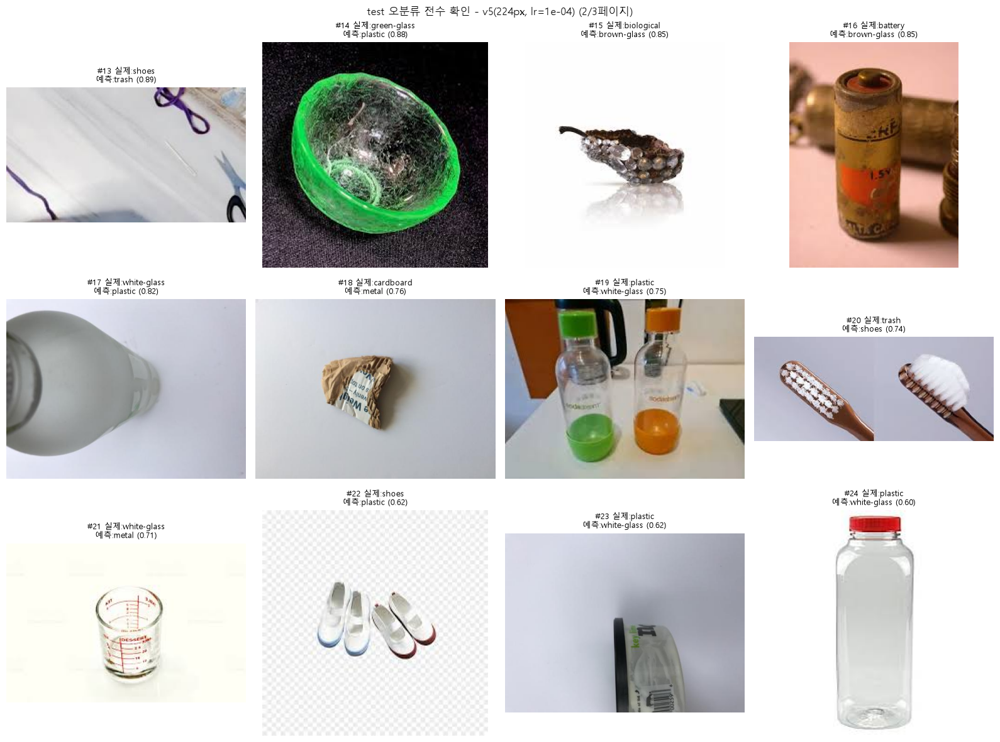

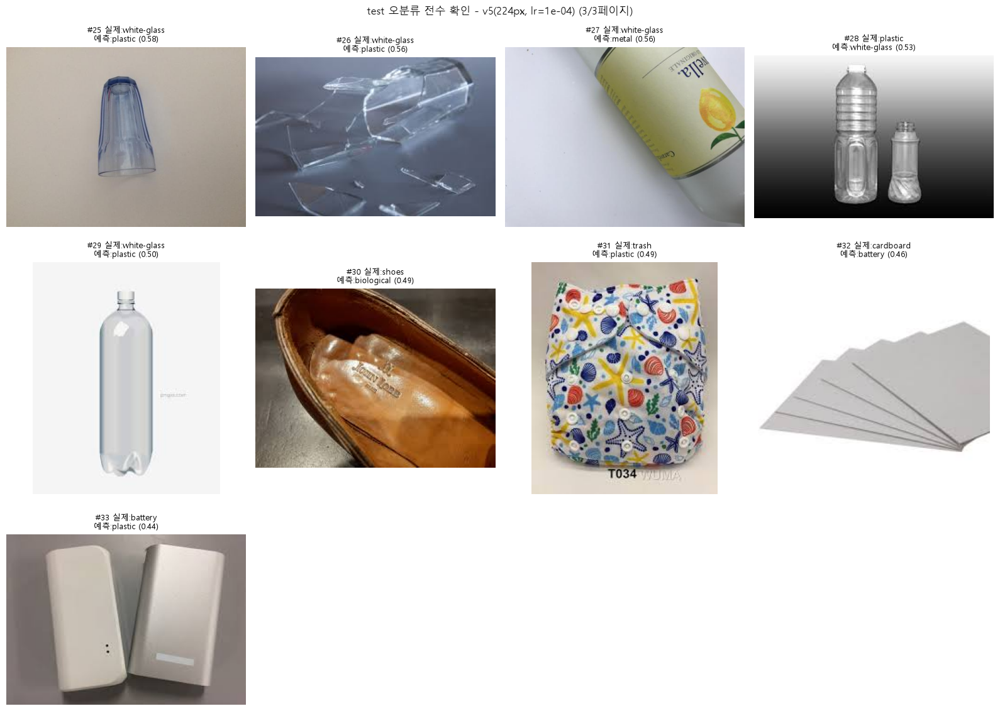

In [39]:
PER_PAGE = 12
n_pages = (len(order) + PER_PAGE - 1) // PER_PAGE
for p in range(n_pages):
    chunk = order[p * PER_PAGE:(p + 1) * PER_PAGE]
    rows = (len(chunk) + 3) // 4
    plt.figure(figsize=(16, 4 * rows))
    for k, pos in enumerate(chunk):
        path = test_set.paths[pos]
        rank = p * PER_PAGE + k + 1
        plt.subplot(rows, 4, k + 1)
        plt.imshow(Image.open(path))
        plt.title(f'#{rank} 실제:{class_names[test_trues_all[pos]]}\n'
                  f'예측:{class_names[test_preds_all[pos]]} ({test_conf[pos]:.2f})', fontsize=9)
        plt.axis('off')
    plt.suptitle(f'test 오분류 전수 확인 - v5(224px, lr=1e-04) ({p + 1}/{n_pages}페이지)')
    plt.tight_layout()
    plt.show()


## 13. 최종 산출물 갱신 — v5 기준 probs/preds (팀 노트북 입력)

`03_Team_Analysis.ipynb`(팀 최종본)가 입력으로 읽는 `probs_val/test.npy`, `preds_val/test.csv`를 v5(224px, lr=1e-04) 모델 기준으로 갱신한다. 갱신 전 값은 `results/pre_v5_backup/`에 백업해뒀다. `split_hj.csv`는 분할 구성 자체가 바뀌지 않으므로 다시 쓰지 않는다.

In [40]:
# -*- coding: utf-8 -*-
"""13절 셀 1 — v5(224px, lr=1e-04) 모델 기준으로 probs/preds/split을 다시 저장한다.
9절 마지막 dump() 셀과 동일한 산출물(probs_val/test.npy, preds_val/test.csv)을
v5 모델로 갱신한다. 이 파일들은 `03_Team_Analysis.ipynb`(팀 최종본)가 입력으로 읽는다.
split_hj.csv는 분할 구성 자체가 바뀌지 않으므로 다시 쓰지 않는다(그대로 둠)."""
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
IMAGE_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
class_names = ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes',
               'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']

PROJECT_DIR = r"<PROJECT>\KDT17\17-team_project4"
os.chdir(PROJECT_DIR)
split_df = pd.read_csv("split_hj.csv")
val_df = split_df[split_df.split == "val"]
test_df = split_df[split_df.split == "test"]


class ManifestDataset(Dataset):
    def __init__(self, paths, targets, transform=None):
        self.paths = paths; self.targets = targets; self.transform = transform
    def __len__(self):
        return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform is not None:
            img = self.transform(img)
        return img, int(self.targets[idx])


crop_resize = int(IMAGE_SIZE * 1.15)
eval_tf = transforms.Compose([
    transforms.Resize(crop_resize), transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(), transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)])

val_set = ManifestDataset(val_df["path"].tolist(), val_df["label_idx"].values, transform=eval_tf)
test_set = ManifestDataset(test_df["path"].tolist(), test_df["label_idx"].values, transform=eval_tf)
val_loader = DataLoader(val_set, batch_size=32, shuffle=False)
test_loader = DataLoader(test_set, batch_size=32, shuffle=False)


class TransferModel(nn.Module):
    def __init__(self, num_classes=12, freeze=True):
        super().__init__()
        weights = models.EfficientNet_V2_S_Weights.IMAGENET1K_V1
        backbone = models.efficientnet_v2_s(weights=weights)
        self.features = backbone.features
        if freeze:
            for p in self.features.parameters():
                p.requires_grad = False
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(1280, num_classes)
    def forward(self, x):
        x = self.features(x)
        x = self.pool(x).flatten(1)
        return self.fc(self.dropout(x))


best_model = TransferModel(num_classes=len(class_names), freeze=False)
best_model.load_state_dict(torch.load('unfreeze_lr_1e-04_img224_v3.pt', map_location=device))
best_model = best_model.to(device)


@torch.no_grad()
def dump(model, loader, name):
    model.eval(); P, T = [], []
    for xb, yb in loader:
        P.append(torch.softmax(model(xb.to(device)), 1).cpu().numpy())
        T.append(yb.numpy())
    P, T = np.concatenate(P), np.concatenate(T)
    np.save(f'probs_{name}.npy', P)
    pd.DataFrame({'true_idx': T, 'pred_idx': P.argmax(1),
                  'confidence': P.max(1)}).to_csv(f'preds_{name}.csv', index=False)
    print(name, P.shape)

dump(best_model, val_loader, 'val')
dump(best_model, test_loader, 'test')

print("\nsplit_hj.csv는 분할 구성이 바뀌지 않아 다시 쓰지 않음(그대로 유지).")
print(f"갱신 기준 모델: EfficientNetV2S(unfreeze, lr=1e-04, img=224) [v5, 11-1절/12절 최종 채택]")


val (2318, 12)


test (2334, 12)

split_hj.csv는 분할 구성이 바뀌지 않아 다시 쓰지 않음(그대로 유지).
갱신 기준 모델: EfficientNetV2S(unfreeze, lr=1e-04, img=224) [v5, 11-1절/12절 최종 채택]


## 최종 정리

**최종 채택 모델**: EfficientNetV2-S (unfreeze) · 입력 224px · lr 1e-4 · ReduceLROnPlateau · patience 3
`unfreeze_lr_1e-04_img224_v3.pt`

| 지표 | test (2,334장) |
|---|---:|
| accuracy | 0.9859 |
| **macro-F1** | **0.9787** |
| macro-recall | 0.9790 |

**개선 경로에서 확인한 것**

- **해상도가 재질 혼동의 상당 부분을 설명했다.** 128 → 224px 로 올리자 `plastic`(F1 0.9105 → 0.9575), `metal`(0.9333 → 0.9617)이 크게 개선됐다. 정제로 해결되지 않던 재질 혼동의 상당수가 저해상도로 인한 질감 정보 손실이었을 가능성이 있다.
- **128px 에서 최적이던 학습률이 224px 에서도 최적은 아니었다.** 5e-5 → 1e-4 로 바꾸자 val macro-F1 이 0.9787 → 0.9840 으로 올랐다. 조건이 바뀌면 하이퍼파라미터도 다시 골라야 한다.
- **앙상블은 채택하지 않았다.** 128px 에서는 3-lr 앙상블이 단일모델보다 뚜렷이 좋았지만(+0.0119), 224px 에서는 차이가 +0.0006 으로 시드 노이즈 기준선(±0.0046)보다 작았다. 단일모델 성능이 이미 0.98대라 짜낼 여지가 적었던 것으로 본다.
- **val 과 test 가 어긋난 사례를 기록해둔다.** 11-1절에서 lr 1e-4 채택 근거는 val 기준 +0.0053 이었는데 test 에서는 +0.0001 에 그쳤다. 그 격차 자체가 상당 부분 노이즈였을 가능성이 있다. 다만 채택 판단은 이미 val 로 내렸으므로 test 결과를 이유로 되돌리지 않았다.

**남은 한계**

- 근접중복 탐지 임계값(Hamming 5, 픽셀차 0.05)은 시행착오로 정한 값이고 최적화된 값이 아니다.
- 라벨 검수는 모델이 확신하며 틀린 것만 후보로 올리므로, 모델이 애초에 잘 못 배우는 유형의 오류는 놓친다.
- 시드 5회 반복에서 test macro-F1 이 0.9642 ± 0.0046 이었다. 0.005 안팎의 차이는 이 변동 폭 안에 있을 수 있다.
- 이 데이터셋은 제품 사진 위주라 실제 배출 현장의 더러워지고 구겨진 쓰레기에는 성능이 떨어질 가능성이 크다.